In [1]:
import sys
sys.path.append("../../..")

from datetime import date
import pandas as pd
import plotly.graph_objects as go
import numpy as np
import rasterio as rio
import rioxarray as rxr

from modules import processing_module as processing
from modules import interpolation_module as interp
from modules import ai_module_extended as ai

2025-03-04 23:45:20.485359: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-04 23:45:20.486558: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-04 23:45:20.508715: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-04 23:45:20.509210: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-04 23:45:20.903236: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not fin

In [2]:
def load_model(pollutant, training_mode, prefix):
    train_path = f'../harmonia_processor/{pollutant}/train/training_{training_mode}.csv'
    training_dataset = importer.import_df(train_path, date_format='%Y-%m-%d')
    training_dataset = training_dataset.dropna()
    training_dates = training_dataset.copy()[['date']]
    if 'date' in list(training_dataset.columns):
        training_dataset = training_dataset.drop(['date'], axis=1)

    test_path = f'../harmonia_processor/{pollutant}/train/validation_{training_mode}.csv'
    testing_dataset = importer.import_df(test_path, date_format='%Y-%m-%d')
    testing_dataset = testing_dataset.dropna()
    testing_dates = testing_dataset.copy()[['date']]
    if 'date' in list(testing_dataset.columns):
        testing_dataset = testing_dataset.drop(['date'], axis=1)

    #save the training columns for selecting them in the prediction dataset
    training_columns = list(training_dataset.columns)
    training_columns.remove('exc')

    model_path = f'../harmonia_processor/{pollutant}/model/{prefix}_model_{training_mode}.csv'
    ai_model = ai.MLProcessor(training_dataset.copy(), testing_dataset.copy())
    ai_model.load_model(model_path)
    ai_model.model_type = prefix
    return ai_model

In [3]:
model_options = {
    'RF': {
        "prefix": 'rf_class',
        "training_options": {
            "normalized": False,
            "n_estimators": 500,
            "n_jobs": -1,
            "max_depth": 30,
            "random_state": None
        },
        "prediction_options": {
            "normalized": False
        }
    },
    
    'SVM': {
        "prefix": 'svm_class',
        "training_options": {
            "normalized": True,
            "kernel": 'rbf',
            "probability": True,
            "verbose": False,
            "max_iter": 10,
            "random_state": None,
            "cache_size": 1024,
            "n_jobs": 5
        },
        "prediction_options":{
            "normalized": True,
        }
    },
    
    'LSTM': {
        "prefix": 'lstm_class',
        "training_options": {
            "normalized": True,
            "activation": 'sigmoid',
            "metrics": ['accuracy'],
            "optimizer": 'adam',
            "loss": 'binary_crossentropy'
        },
        "prediction_options":{
            "normalized": True,
        }
    },
    'XGBoost': {
        "prefix": 'xgb_class',
        "training_options": {
            "normalized": True,
            "activation": 'sigmoid',
            "metrics": ['accuracy'],
            "optimizer": 'adam',
            "loss": 'binary_crossentropy'
        },
        "prediction_options":{
            "normalized": True,
        }
    }
}


In [4]:
pollutant_data = {
    'pm10': {
        "threshold": 45 #daily in regulation: CORRECT
    }, 
    'pm25': {
        "threshold": 25 #daily not in regulation: Estimated using the EU yearly + AQI Poor limit 
    }, 
    'no2': {
        "threshold": 50 #daily not in regulation: Estimated using the EU yearly and hourly limits + AQI Poor limit 
    }, 
    'so2': {
        "threshold": 50 #daily in regulation: CORRECT
    }, 
    'o3': {
        "threshold": 120 #8-hour mean in regulation: NO CORRECT
    }, 
}

In [25]:
importer = processing.HarmoniaProcessor()
#pollutants = ['pm10', 'pm25', 'no2', 'so2', 'o3']
pollutants = ['no2']
#Missing no2 because there are not exceedances
#models = ['LSTM','RF','SVM','XGBoost']
models = ['XGBoost']
#train_modes = ['rand_balance','NOrand_balance','rand_NObalance','NOrand_NObalance']
train_modes = ['rand_NObalance']


In [26]:
#Score the models
scores_df_columns = ["type", "train_mode", "pollutant", "prefix", "accuracy", "precision", "recall", "F1"]
scores_df = pd.DataFrame(columns=scores_df_columns)

for model_to_use in models:
    prefix = model_options[model_to_use]['prefix']
    print(f"FOR {model_to_use}")

    for pollutant in pollutants:
        print(f"FOR {pollutant}")
        pollutant_threshold = pollutant_data[pollutant]['threshold']
        
        for training_mode in train_modes:
    
            train_path = f'../harmonia_processor/{pollutant}/train/training_{training_mode}.csv'
            training_dataset = importer.import_df(train_path, date_format='%Y-%m-%d')
            training_dataset = training_dataset.dropna()
            training_dates = training_dataset.copy()[['date']]
            if 'date' in list(training_dataset.columns):
                training_dataset = training_dataset.drop(['date'], axis=1)
            #Update pollution thresholds to latest regulation (2030)
            training_dataset['exc'] = np.where(training_dataset[pollutant].gt(pollutant_threshold), 1, 0)

            test_path = f'../harmonia_processor/{pollutant}/train/validation_{training_mode}.csv'
            testing_dataset = importer.import_df(test_path, date_format='%Y-%m-%d')
            testing_dataset = testing_dataset.dropna()
            testing_dates = testing_dataset.copy()[['date']]
            if 'date' in list(testing_dataset.columns):
                testing_dataset = testing_dataset.drop(['date'], axis=1)
            #Update pollution thresholds to latest regulation (2030)
            testing_dataset['exc'] = np.where(testing_dataset[pollutant].gt(pollutant_threshold), 1, 0)

            #save the training columns for selecting them in the prediction dataset
            training_columns = list(training_dataset.columns)
            training_columns.remove('exc')
            #remove the measurement as well e.g., 'pm10'
            training_columns.remove(pollutant)


            ai_model = ai.AIProcessor(model_type=model_to_use, task_type='classification',hyperparameter_tuning=False)
            ai_model.set_data(partition=False, normalize=False, data={'train': training_dataset.copy(), 'test':testing_dataset.copy(),'training_columns': training_columns ,'target':'exc'})

            ai_model.fit()
            model_path = f'../harmonia_processor/{pollutant}/model/{prefix}_model_{training_mode}.csv'
            ai_model.save_model(model_path)
        
            
            #score = ai_model.score_model()
            score = ai_model.assess(format='tabular')
            print(score)
            score_row = [model_to_use, training_mode, pollutant, prefix] + score
            scores_df = pd.concat([
                scores_df, 
                pd.DataFrame(
                    [score_row], 
                    columns=scores_df_columns
                )
            ])
            
    
#scores_path = f'../harmonia_processor/model_scores.csv'
#scores_df.to_csv(scores_path)
scores_df

FOR XGBoost
FOR no2
[0.849638217177287, 0.7840336903781012, 0.7260703688003391, 0.7539396073598027]


,type,train_mode,pollutant,prefix,accuracy,precision,recall,F1
0,XGBoost,rand_NObalance,no2,xgb_class,0.849638,0.784034,0.72607,0.75394


In [27]:
exp = ai_model.explain_model()

In [28]:
import shap

In [29]:
explainer = shap.Explainer(ai_model.model)   
shap_values = explainer(ai_model.X_train)

In [129]:
#shap_values.feature_names = training_columns

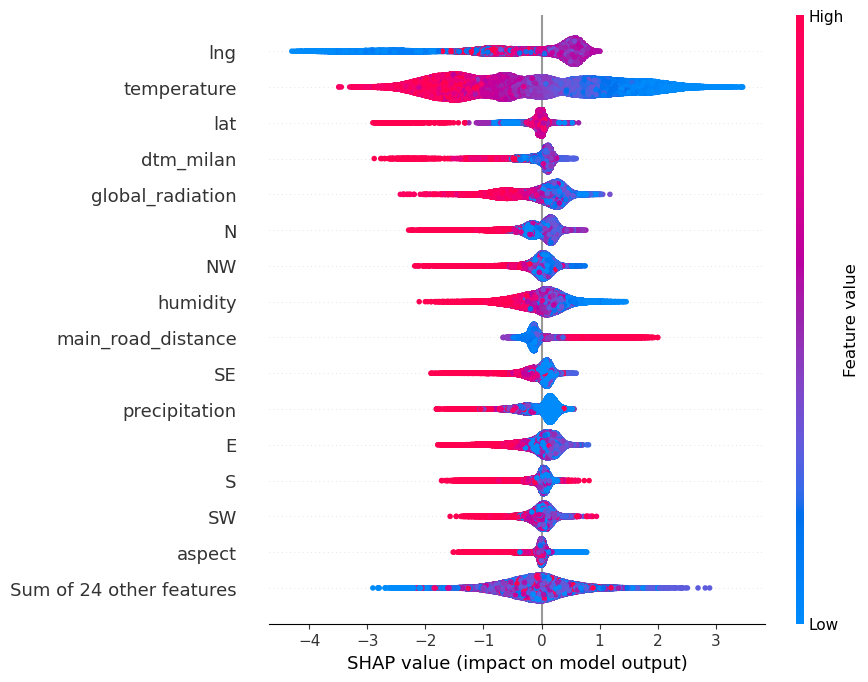

In [30]:
shap.plots.beeswarm(shap_values, max_display=16, order=shap_values.abs.max(0))

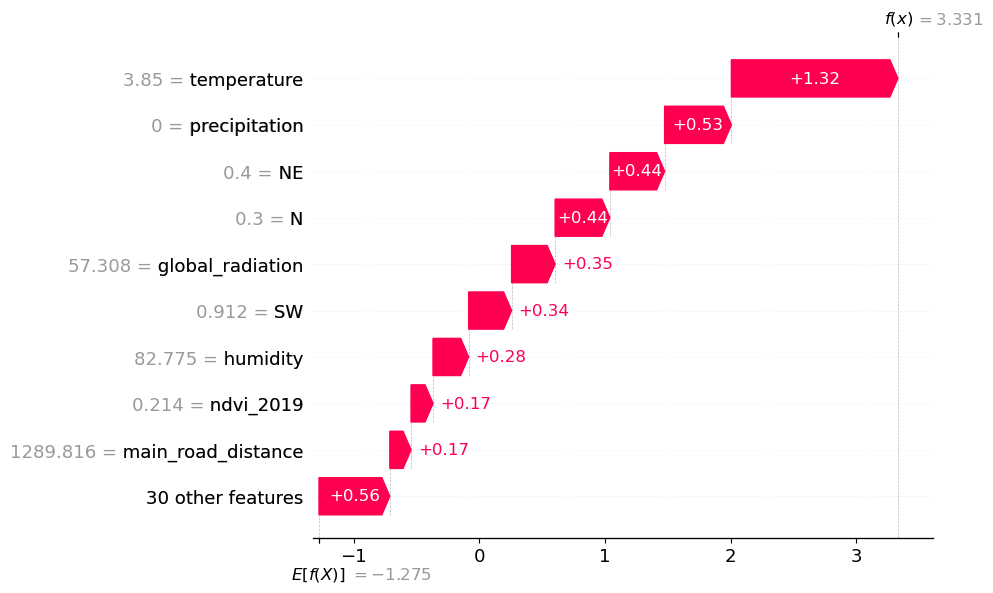

In [132]:
shap.plots.waterfall(shap_values[0])

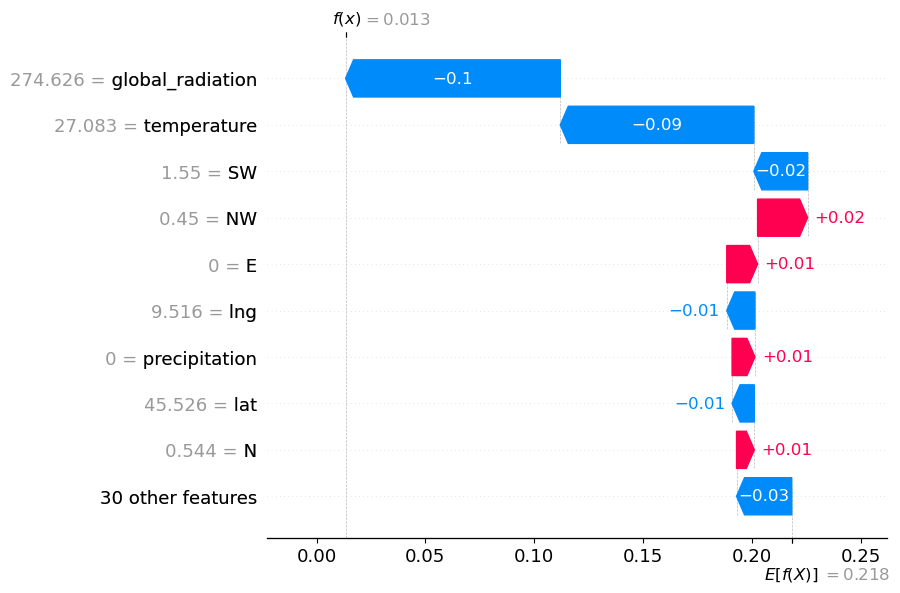

In [13]:
shap.plots.waterfall(temp)

In [12]:
import copy
temp = copy.deepcopy(shap_values[3])
def convert_prob(shap_values):
    #prediction
    p = shap_values.base_values + np.sum(shap_values.values)
    pred = np.exp(p) / (1 + np.exp(p))
    print(f'Prediction: {pred}')
    #baseline
    b = np.exp(shap_values.base_values) / ( 1 + np.exp(shap_values.base_values))
    #shap_values 
    v = shap_values.values / np.sum(shap_values.values) * (pred - b)
    #shap_values.values = () / (1 + np.exp(shap_values.values * -1))

    shap_values.base_values = b
    shap_values.values = v
    return shap_values

convert_prob(temp)

Prediction: 0.01336972626252629


.values =
array([-1.0220015e-02, -1.2961030e-02,  3.0917577e-03, -9.8675534e-02,
       -8.8939331e-02,  1.0510677e-02,  8.1623644e-03, -9.8030036e-04,
        1.4180233e-02,  1.1931735e-03,  3.5418663e-04, -2.4697652e-02,
       -3.7944843e-03,  2.2979293e-02, -2.7359398e-03, -4.2446540e-03,
       -3.4762570e-04, -3.3501836e-03,  1.2576999e-06, -9.0462590e-06,
       -1.1606040e-06, -6.8820656e-05,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00, -1.1730097e-05,  9.7193646e-05,  2.7507357e-04,
        1.6459964e-04, -1.1514307e-03, -9.5901784e-04, -4.6872902e-03,
       -6.7102298e-04, -7.4661020e-03,  6.5596185e-05,  5.2294040e-06,
       -4.2629446e-05, -9.7023738e-05,  0.0000000e+00], dtype=float32)

.base_values =
0.21840112654634228

.data =
array([ 4.55264700e+01,  9.51598000e+00,  5.43333333e+01,  2.74626087e+02,
        2.70833333e+01,  0.00000000e+00,  5.44444444e-01,  8.50000000e-01,
        0.00000000e+00,  9.00000000e-01,  8.00000000e-01,  1.55000000e+00,
        1.

In [113]:
import copy
temp = copy.deepcopy(shap_values[0])
def convert_prob(shap_values):
    #shap_values.values = 1 / (1 + np.exp(shap_values.values * -1))
    shap_values.base_values = 1 / (1 + np.exp(shap_values.base_values * -1))
    #shap_values.data = 1 / (1 + np.exp(shap_values.data * -1))
    return shap_values

convert_prob(temp)



.values =
array([0.9871158 , 0.9765343 , 0.75325644, 0.7071107 , 0.26584375,
       0.5878907 , 0.64706177, 0.6468585 , 0.94002885, 0.9560658 ,
       1.087036  , 0.7105958 , 0.9896458 , 0.8665287 , 0.9739301 ,
       0.98234093, 1.0004063 , 0.8395062 , 1.0000235 , 1.0001075 ,
       0.99985397, 1.0011528 , 1.        , 1.        , 1.        ,
       0.8770792 , 0.9977971 , 1.0340668 , 0.99759984, 1.003185  ,
       0.9979259 , 0.8902815 , 0.9136118 , 0.84462434, 0.99969256,
       0.99994254, 0.99973077, 1.0014887 , 1.        ], dtype=float32)

.base_values =
0.2184011360643731

.data =
array([ 0.00918928,  0.40147062,  0.65540304, -1.00960455, -1.28792515,
       -0.41864882, -0.66254386, -0.59571152, -1.22747394, -1.10589364,
        0.37744108,  0.00346106, -0.06399127,  0.48569725, -0.63958433,
       -0.78567367, -0.2687268 , -0.57790216, -0.70926233, -0.87418354,
        2.95754406, -0.19145392, -0.19833019, -0.13686066, -0.19863048,
        0.02418621,  0.12355587, -0.40715316, 

In [20]:
ai_model.y_train.describe()

count    99693.000000
mean         0.249957
std          0.432990
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: exc, dtype: float64

In [12]:
#plot for model accuracies
metric_to_plot = 'F1'
for model in models:
    plot_dfs = []
    plot_names = []
    sort_by = 'train_mode'
    print(f"--------------------------------------------------")
    print(f"scores for model {model}")
    for pollutant in pollutants:
        if (pollutant != 'o3' and model != 'SVM'):
            temp_plot_df = scores_df.loc[
                (scores_df['pollutant'] == pollutant) & (scores_df['type'] == model)
            ].reset_index(drop=True).sort_values(by=sort_by)
            plot_dfs.append(temp_plot_df.copy())
            plot_names.append(pollutant)

    importer.show_plot(
        plot_dfs,
        ['train_mode', 'train_mode', 'train_mode', 'train_mode'],
        [metric_to_plot, metric_to_plot, metric_to_plot, metric_to_plot],
        plot_names
    )

--------------------------------------------------
scores for model XGBoost


In [7]:
#calculate best models
'''
scores_path = f'../harmonia_processor/model_scores.csv'
scores_df = importer.import_df(scores_path, date_format=None)
scores_df = scores_df.reset_index(drop=True)
'''
best_model_data = {}
for pollutant in pollutants:
    best = scores_df.sort_values(by='F1', ascending=False).loc[
        scores_df['pollutant'] == pollutant
    ].reset_index(drop=True).iloc[0]
    best_path = f'../harmonia_processor/{pollutant}/model/{best.prefix}_model_{best.train_mode}.csv'
    best_type = best.type
    best_model_data[pollutant] = {
        "model_path": best_path,
        "prefix": best.prefix,
        "train_mode": best.train_mode,
        "type": best_type,
        "score": best.F1
    }
best_model_data

{'pm10': {'model_path': '../harmonia_processor/pm10/model/xgb_class_model_rand_NObalance.csv',
  'prefix': 'xgb_class',
  'train_mode': 'rand_NObalance',
  'type': 'XGBoost',
  'score': 0.8291752067283906},
 'pm25': {'model_path': '../harmonia_processor/pm25/model/xgb_class_model_rand_NObalance.csv',
  'prefix': 'xgb_class',
  'train_mode': 'rand_NObalance',
  'type': 'XGBoost',
  'score': 0.7515574383254423},
 'no2': {'model_path': '../harmonia_processor/no2/model/xgb_class_model_NOrand_balance.csv',
  'prefix': 'xgb_class',
  'train_mode': 'NOrand_balance',
  'type': 'XGBoost',
  'score': 0.6159500183755973}}

In [11]:
#predict the stations and grid samples for each model, each month, each pollutant, for the best model score
best_base_path_predictions = f'../best_model/predictions'
pollutants = ['pm10', 'pm25', 'no2']
for pollutant in pollutants:
    print(f"FOR {pollutant}")
    pollutant_threshold = pollutant_data[pollutant]['threshold']
    model_data = best_model_data[pollutant]
    train_mode = model_data['train_mode']
    prefix = model_data['prefix']
    model_to_use = model_data['type']
    print(f'Model to use: {model_to_use}')

    train_path = f'../harmonia_processor/{pollutant}/train/training_{train_mode}.csv'
    training_dataset = importer.import_df(train_path, date_format='%Y-%m-%d')
    training_dataset = training_dataset.dropna()
    training_dates = training_dataset.copy()[['date']]
    if 'date' in list(training_dataset.columns):
        training_dataset = training_dataset.drop(['date'], axis=1)
    #Update pollution thresholds to latest regulation (2030)
    training_dataset['exc'] = np.where(training_dataset[pollutant].gt(pollutant_threshold), 1, 0)

    test_path = f'../harmonia_processor/{pollutant}/train/validation_{train_mode}.csv'
    testing_dataset = importer.import_df(test_path, date_format='%Y-%m-%d')
    testing_dataset = testing_dataset.dropna()
    testing_dates = testing_dataset.copy()[['date']]
    if 'date' in list(testing_dataset.columns):
        testing_dataset = testing_dataset.drop(['date'], axis=1)
    #Update pollution thresholds to latest regulation (2030)
    testing_dataset['exc'] = np.where(testing_dataset[pollutant].gt(pollutant_threshold), 1, 0)

    #save the training columns for selecting them in the prediction dataset
    training_columns = list(training_dataset.columns)
    training_columns.remove('exc')
    #remove the measurement as well e.g., 'pm10'
    training_columns.remove(pollutant)


    ai_model = ai.AIProcessor(model_type=model_to_use, task_type='classification',hyperparameter_tuning=False)
    ai_model.set_data(partition=False, normalize=True, data={'train': training_dataset.copy(), 'test':testing_dataset.copy(),'training_columns': training_columns ,'target':'exc'})

   
    model_path = f'../harmonia_processor/{pollutant}/model/{prefix}_model_{train_mode}.csv'
    ai_model.load_model(model_path)

    predictions = {}
    predictions_grid = {}
    predicts = {}
    predicts_grid = {}

    for m in range(1,13):
        print(f'FOR {pollutant} MONTH {m}')
        print(f"Predicting in stations datasets")
        predict_path = f'../harmonia_processor/{pollutant}/predict/stations_month_{m}.csv'
        prediction_df =  importer.import_df(predict_path, date_format=None)
        prediction_dataset = prediction_df.copy()
        prediction_dataset = prediction_dataset[training_columns]
        predicts[m] = prediction_df.copy()
        if 'date' in list(prediction_dataset.columns):
            prediction_dataset = prediction_dataset.drop(['date'], axis=1)

        prediction_dataset = prediction_dataset.reset_index(drop=True).dropna()

        '''
        if model_to_use == 'lstm':
            predicted_probabilities = ai_model.predict(
                prediction_dataset.copy(), 
                predict_options=model_options[model_to_use]['prediction_options']
            )
        else:
            predicted_probabilities = ai_model.predict_probabilities(
                prediction_dataset.copy(),
                predict_options=model_options[model_to_use]['prediction_options']
            )
            predicted_probabilities = predicted_probabilities[:,1]
        '''

        predicted_probabilities = ai_model.predict(prediction_dataset.copy(), normalized=True)
        #Create a DF from predicted labels
        predicted_df = pd.DataFrame(predicted_probabilities)
        predicted_df.columns = ['exc']

        #Concat DF with UTM coordinates 
        predicted_df = predicted_df.reset_index(drop=True)
        prediction_locations = prediction_dataset[['lat','lng']].reset_index(drop=True)
        predicted_df = pd.concat([predicted_df, prediction_locations],axis=1)
        predicted_df['exc'] = predicted_df['exc']*100

        predictions[m] = predicted_df.copy()

        prediction_path = f'{best_base_path_predictions}/best_{pollutant}_stations_month_{m}.csv'
        predictions[m].to_csv(prediction_path)


        print(f"Predicting in grid datasets")
        predict_path = f'../harmonia_processor/{pollutant}/predict/grid_month_{m}.csv'
        prediction_df =  importer.import_df(predict_path, date_format=None)
        prediction_dataset = prediction_df.copy()
        prediction_dataset = prediction_dataset[training_columns]
        predicts_grid[m] = prediction_df.copy()
        if 'date' in list(prediction_dataset.columns):
            prediction_dataset = prediction_dataset.drop(['date'], axis=1)


        prediction_dataset = prediction_dataset.reset_index(drop=True).dropna()

        '''
        if model_to_use == 'lstm':
            predicted_probabilities = ai_model.predict(
                prediction_dataset.copy(), 
                predict_options=model_options[model_to_use]['prediction_options']
            )
        else:
            predicted_probabilities = ai_model.predict_probabilities(
                prediction_dataset.copy(), 
                predict_options=model_options[model_to_use]['prediction_options']
            )
            predicted_probabilities = predicted_probabilities[:,1]
        '''
        predicted_probabilities = ai_model.predict(prediction_dataset.copy(), normalized=True)
        
        #Create a DF from predicted labels
        predicted_df = pd.DataFrame(predicted_probabilities)
        predicted_df.columns = ['exc']

        #Concat DF with UTM coordinates 
        #reset index to avoid indexing problems
        predicted_df = predicted_df.reset_index(drop=True)
        prediction_locations = prediction_dataset[['lat','lng']].reset_index(drop=True)
        predicted_df = pd.concat([predicted_df, prediction_locations],axis=1)
        predicted_df['exc'] = predicted_df['exc']*100

        predictions_grid[m] = predicted_df.copy()

        prediction_path = f'{best_base_path_predictions}/best_{pollutant}_grid_month_{m}.csv'
        predictions_grid[m].to_csv(prediction_path)


FOR pm10
Model to use: RF
FOR pm10 MONTH 1
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 2
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 3
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 4
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 5
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 6
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 7
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 8
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 9
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 10
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 11
Predicting in stations datasets
Predicting in grid datasets
FOR pm10 MONTH 12
Predicting in stations datasets
Predicting in grid datasets
FOR pm25
Model to use: RF
FOR pm25 MONTH 1
Pred

In [12]:
predicted_probabilities

array([0.07312145, 0.07343856, 0.27515697, ..., 0.02022553, 0.016029  ,
       0.12811296], dtype=float32)

In [13]:
milano_shapefile = '../data/milano_final_shapefile/milano_metro.shp'
milano_epsg = 32632
grid = interp.create_grid_from_shapefile(milano_shapefile, xdelta=1000, ydelta=1000, shapefile_epsg=milano_epsg)


The grid of the shapefile


In [11]:
grid

,centroids,original_centroids,lat,lng
0,POINT (9.46843 45.57438),POINT (536549.044 5046866.166),45.574376,9.468434
1,POINT (9.45569 45.58343),POINT (535549.044 5047866.166),45.583428,9.455691
2,POINT (9.50696 45.58321),POINT (539549.044 5047866.166),45.583212,9.506964
3,POINT (9.49415 45.58327),POINT (538549.044 5047866.166),45.583268,9.494145
4,POINT (9.44287 45.58348),POINT (534549.044 5047866.166),45.583479,9.442873
...,...,...,...,...
1726,POINT (8.82804 45.43119),POINT (486549.044 5030866.166),45.431188,8.828041
1727,POINT (8.81526 45.43117),POINT (485549.044 5030866.166),45.431168,8.815257
1728,POINT (8.80247 45.43115),POINT (484549.044 5030866.166),45.431147,8.802473
1729,POINT (8.84083 45.43121),POINT (487549.044 5030866.166),45.431207,8.840825


------ pm10 --- month 1 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


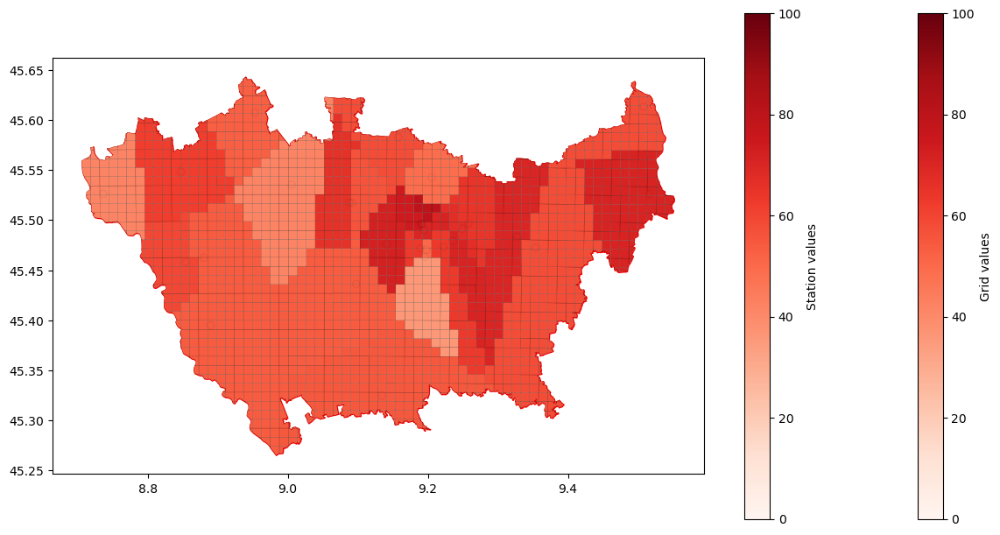

saved raster to ../best_model/rasters/stations_pm10_month_1.tiff
------ pm10 --- month 2 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


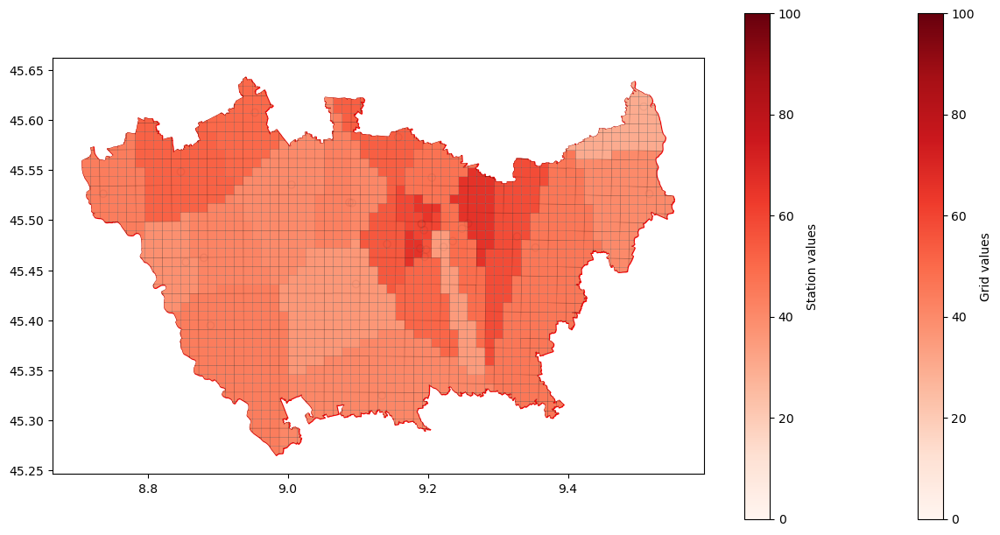

saved raster to ../best_model/rasters/stations_pm10_month_2.tiff
------ pm10 --- month 3 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


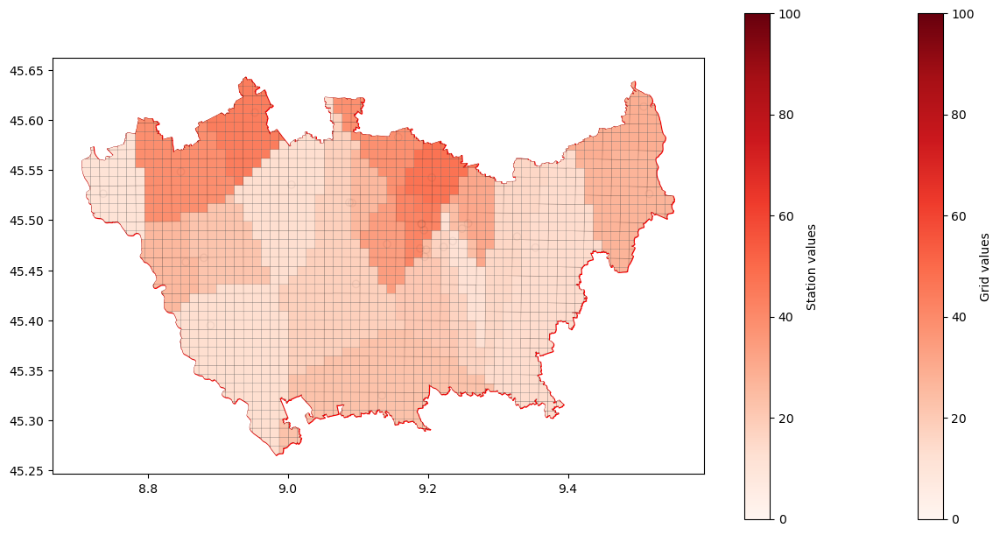

saved raster to ../best_model/rasters/stations_pm10_month_3.tiff
------ pm10 --- month 4 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


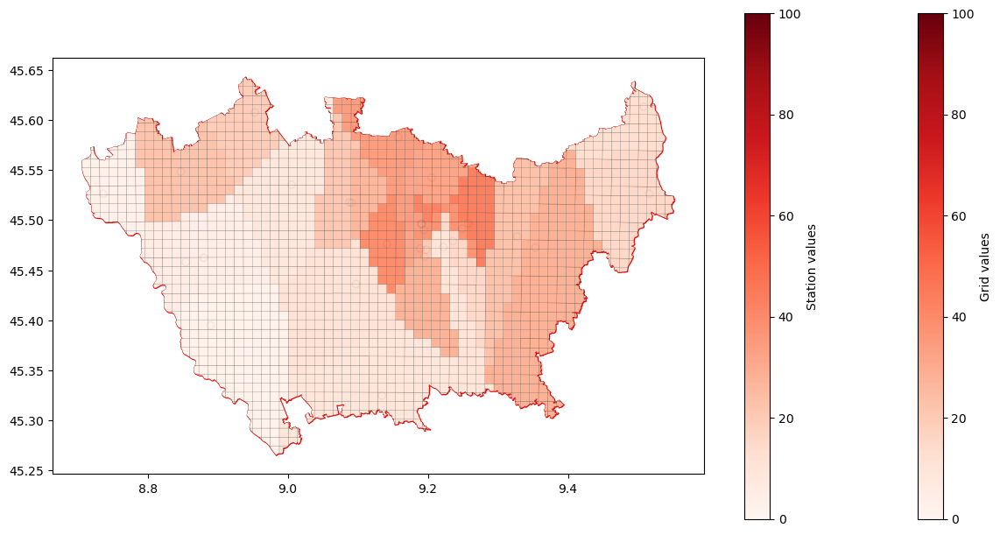

saved raster to ../best_model/rasters/stations_pm10_month_4.tiff
------ pm10 --- month 5 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


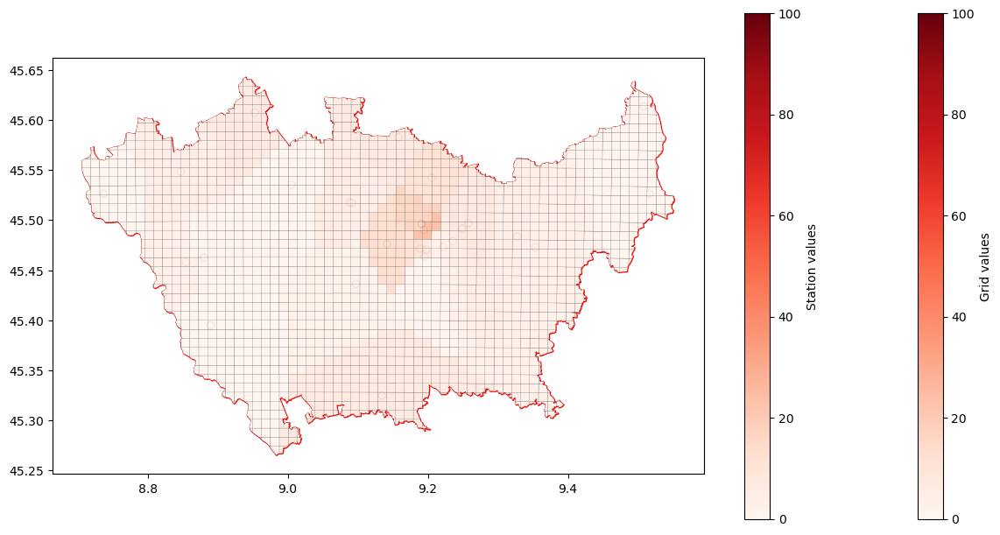

saved raster to ../best_model/rasters/stations_pm10_month_5.tiff
------ pm10 --- month 6 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


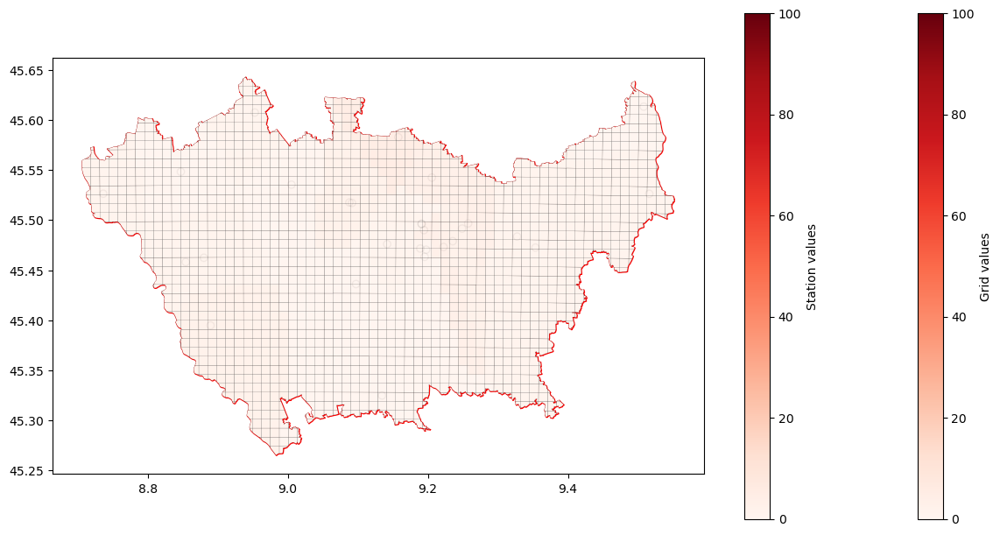

saved raster to ../best_model/rasters/stations_pm10_month_6.tiff
------ pm10 --- month 7 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


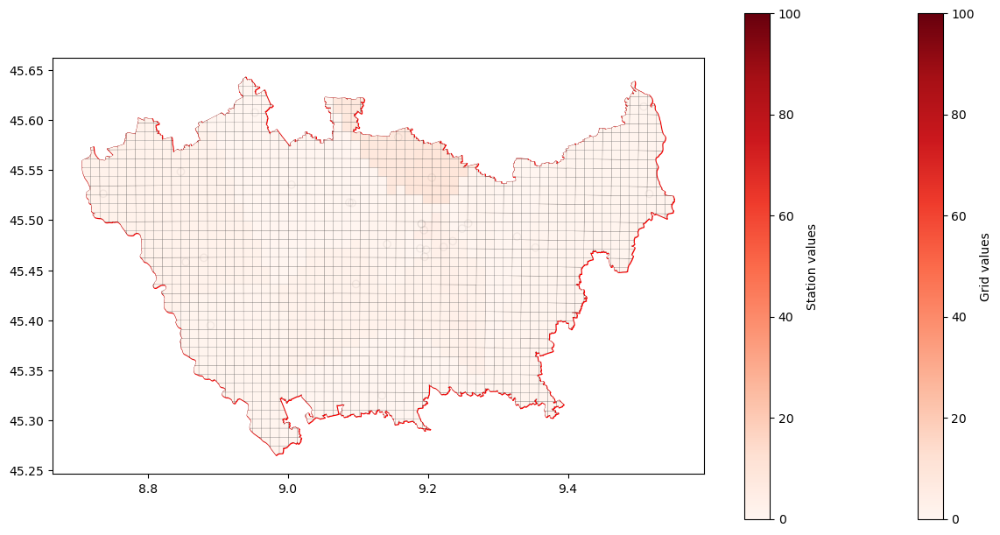

saved raster to ../best_model/rasters/stations_pm10_month_7.tiff
------ pm10 --- month 8 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


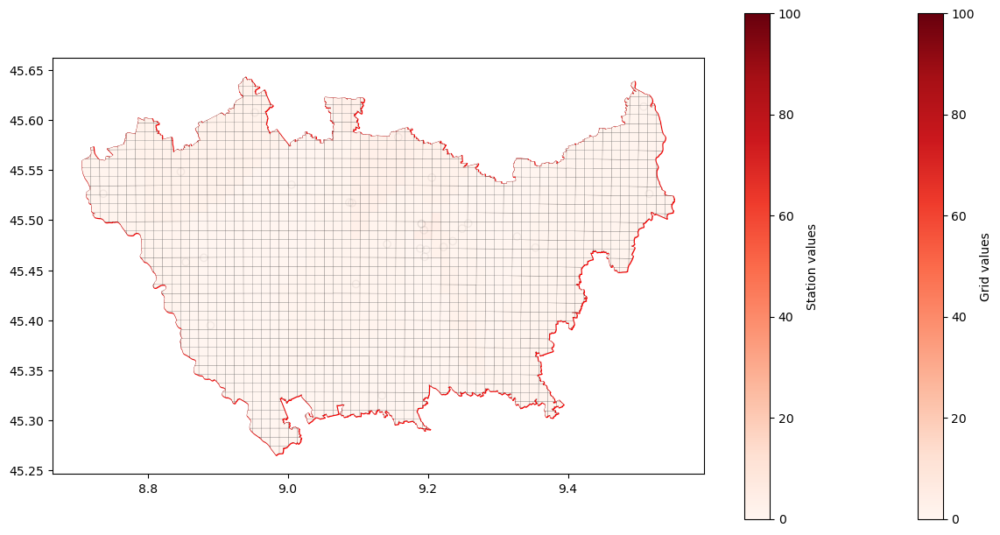

saved raster to ../best_model/rasters/stations_pm10_month_8.tiff
------ pm10 --- month 9 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


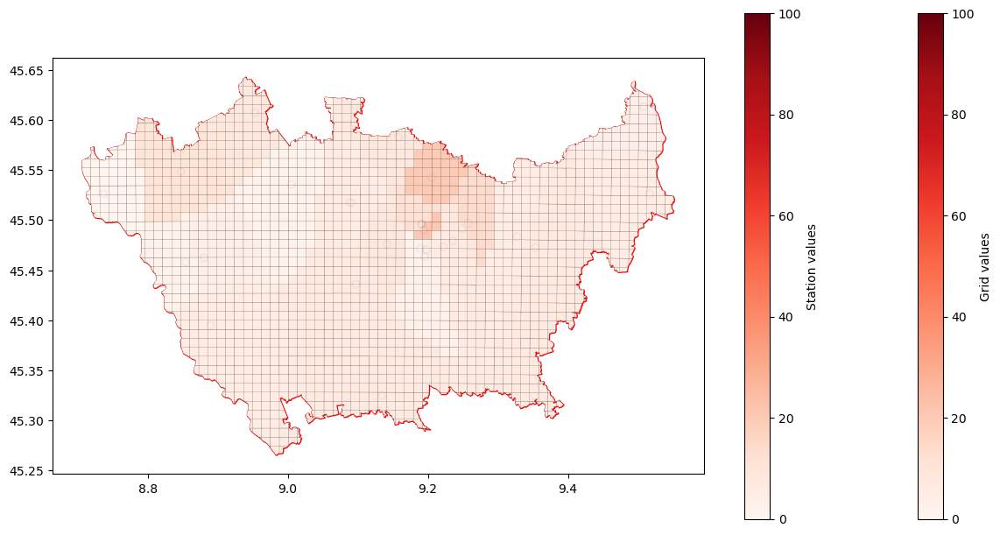

saved raster to ../best_model/rasters/stations_pm10_month_9.tiff
------ pm10 --- month 10 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


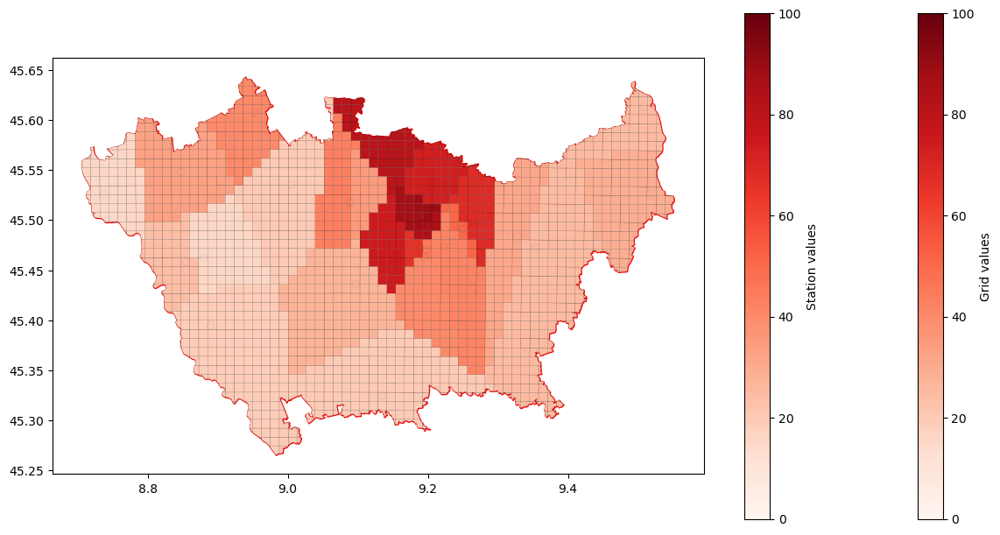

saved raster to ../best_model/rasters/stations_pm10_month_10.tiff
------ pm10 --- month 11 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


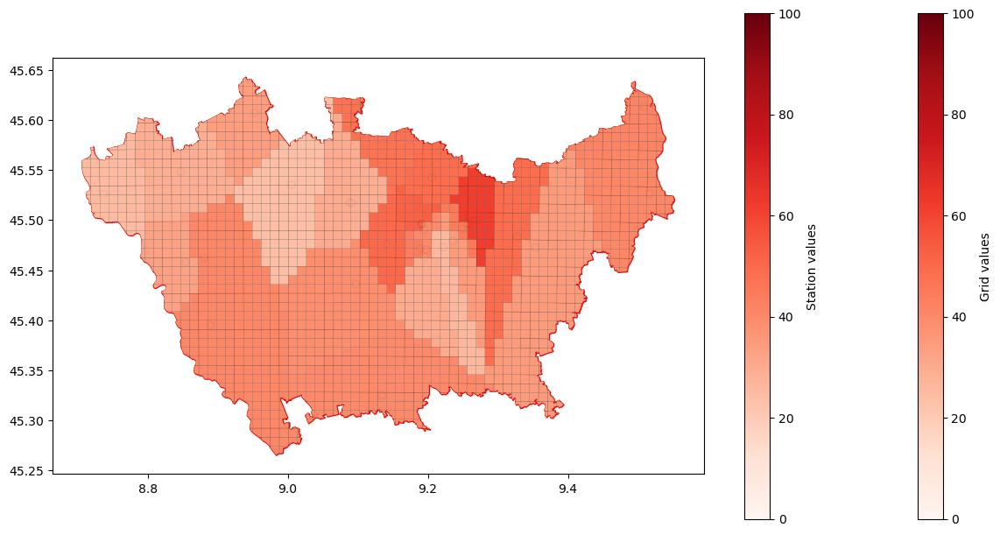

saved raster to ../best_model/rasters/stations_pm10_month_11.tiff
------ pm10 --- month 12 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


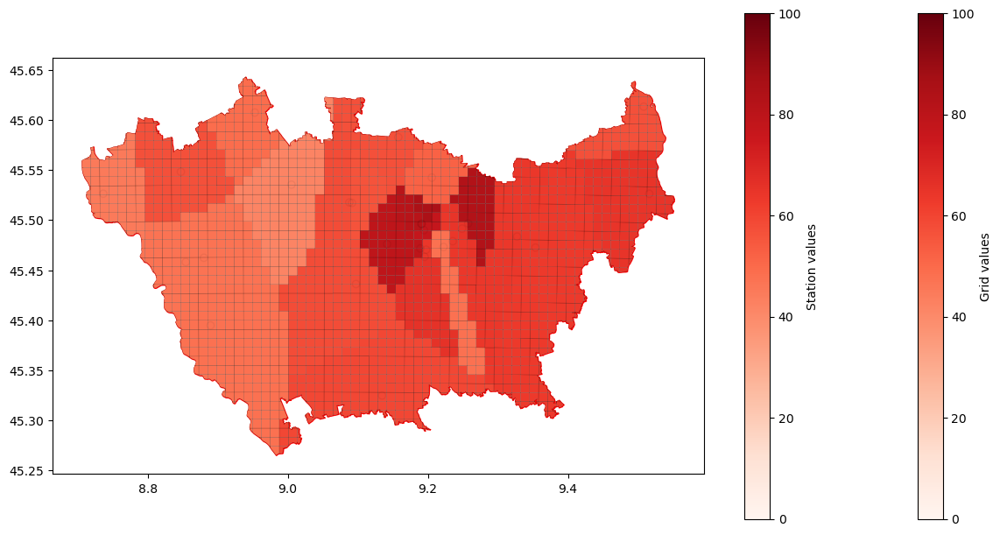

saved raster to ../best_model/rasters/stations_pm10_month_12.tiff
------ pm25 --- month 1 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


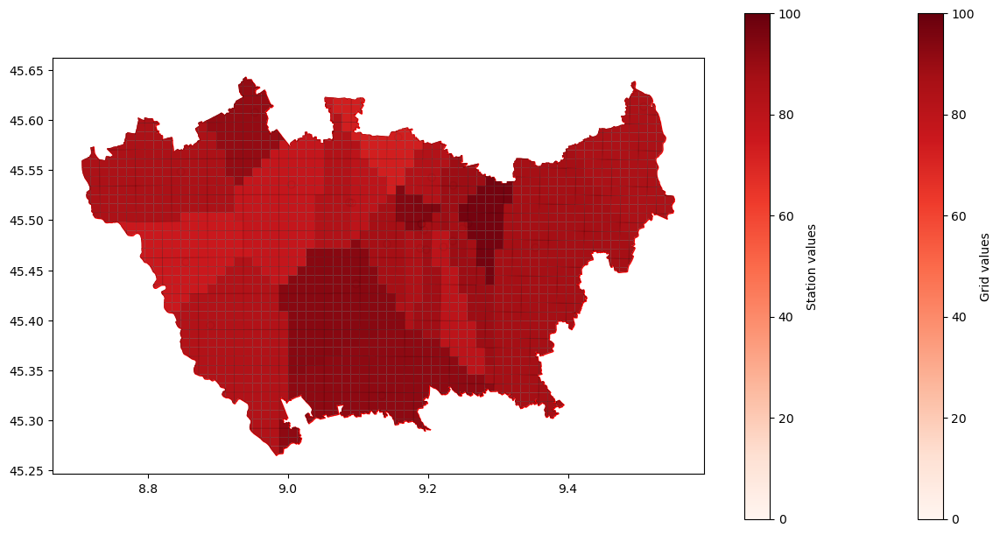

saved raster to ../best_model/rasters/stations_pm25_month_1.tiff
------ pm25 --- month 2 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


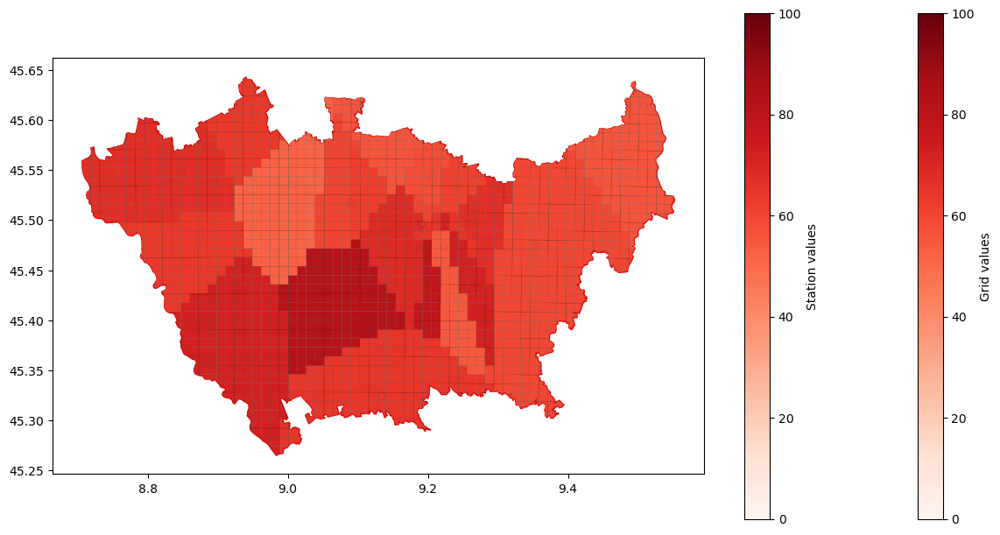

saved raster to ../best_model/rasters/stations_pm25_month_2.tiff
------ pm25 --- month 3 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


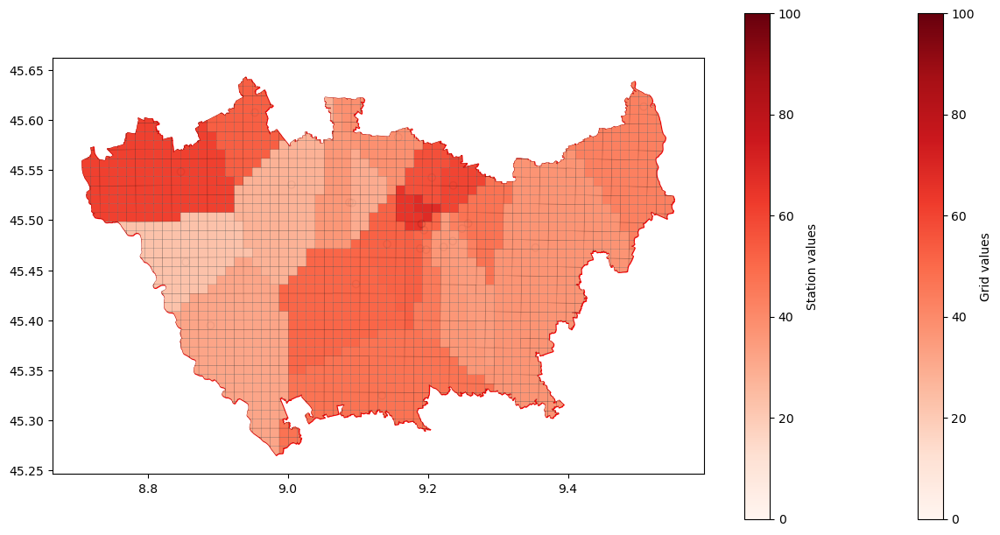

saved raster to ../best_model/rasters/stations_pm25_month_3.tiff
------ pm25 --- month 4 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


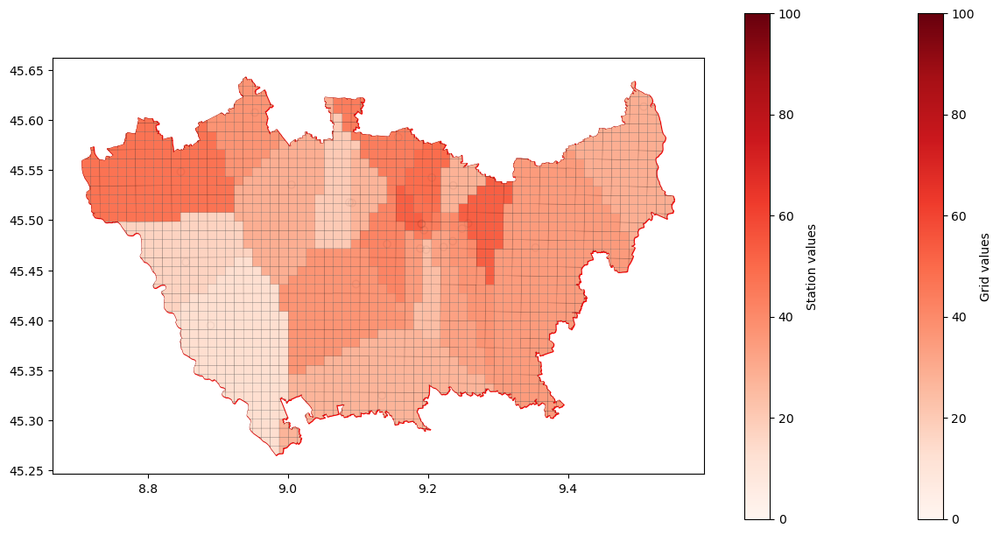

saved raster to ../best_model/rasters/stations_pm25_month_4.tiff
------ pm25 --- month 5 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


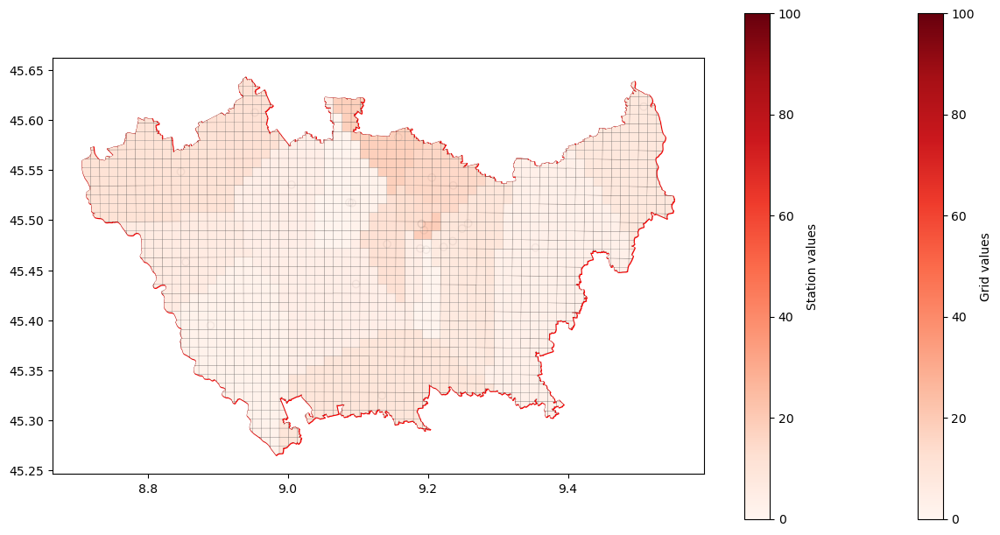

saved raster to ../best_model/rasters/stations_pm25_month_5.tiff
------ pm25 --- month 6 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


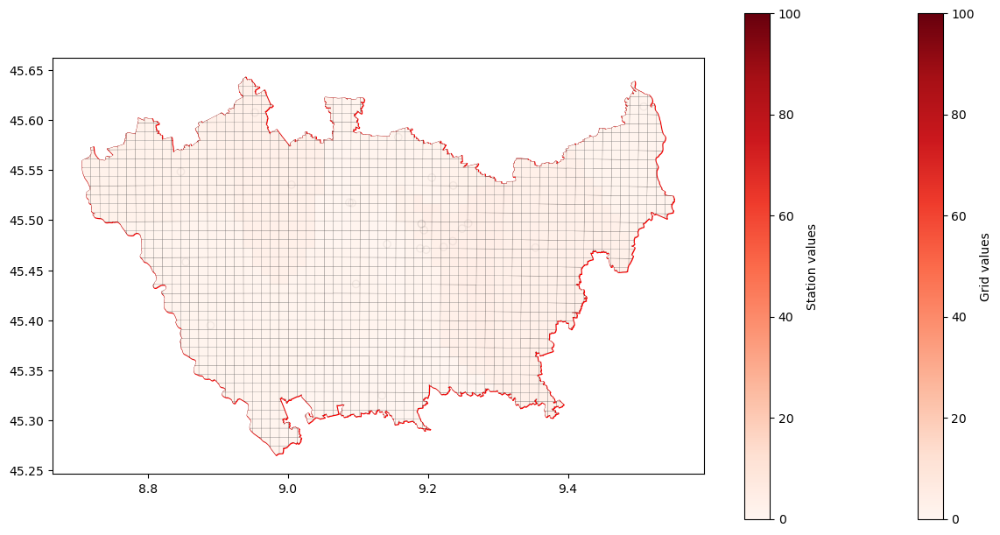

saved raster to ../best_model/rasters/stations_pm25_month_6.tiff
------ pm25 --- month 7 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


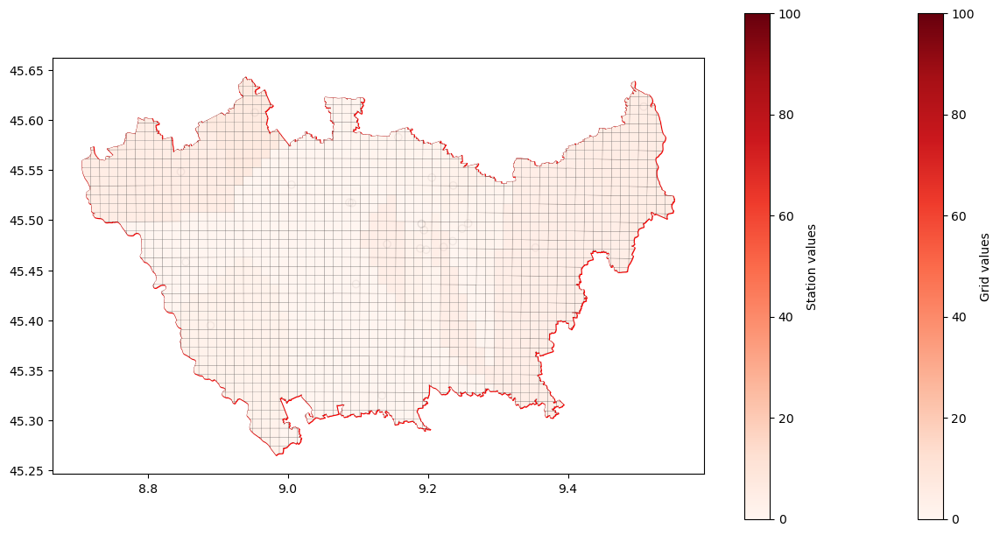

saved raster to ../best_model/rasters/stations_pm25_month_7.tiff
------ pm25 --- month 8 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


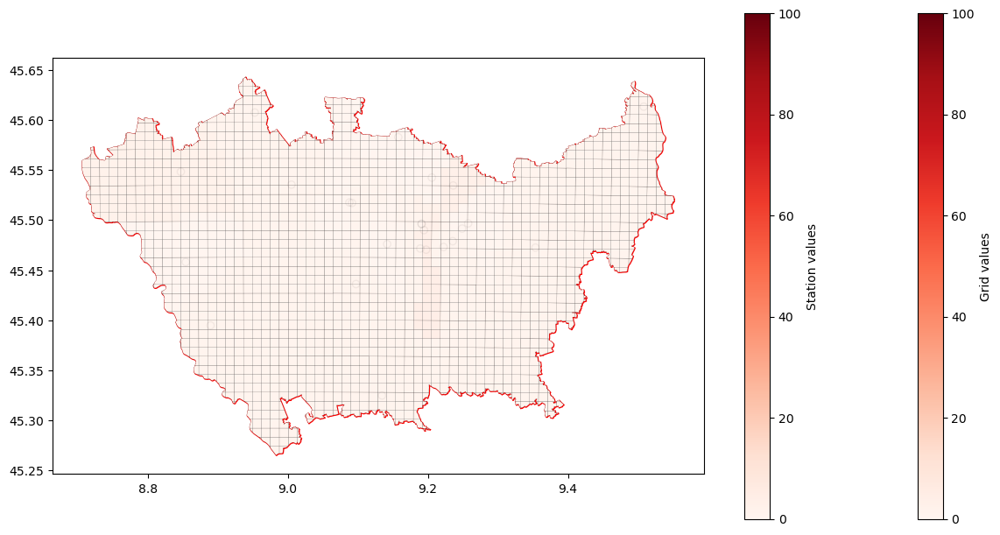

saved raster to ../best_model/rasters/stations_pm25_month_8.tiff
------ pm25 --- month 9 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


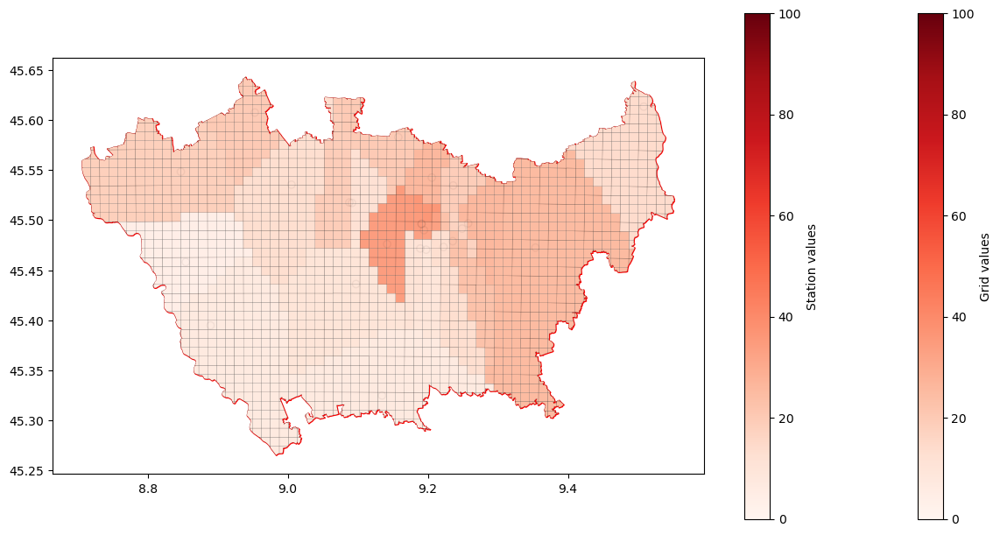

saved raster to ../best_model/rasters/stations_pm25_month_9.tiff
------ pm25 --- month 10 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


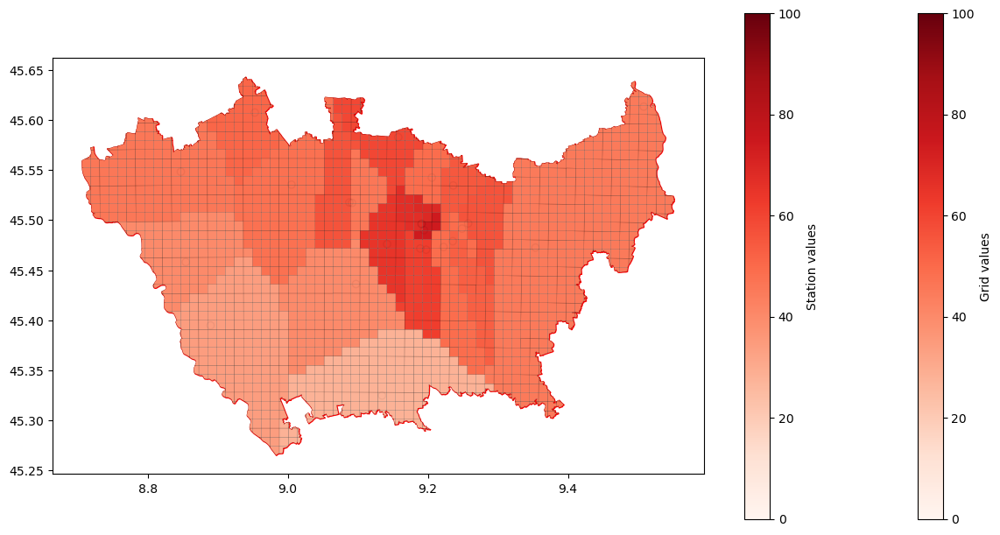

saved raster to ../best_model/rasters/stations_pm25_month_10.tiff
------ pm25 --- month 11 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


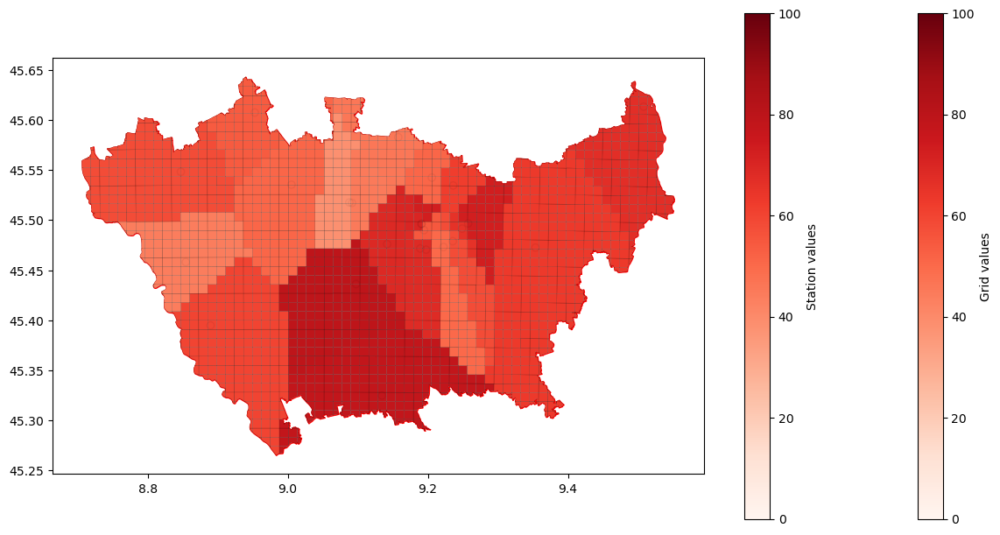

saved raster to ../best_model/rasters/stations_pm25_month_11.tiff
------ pm25 --- month 12 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


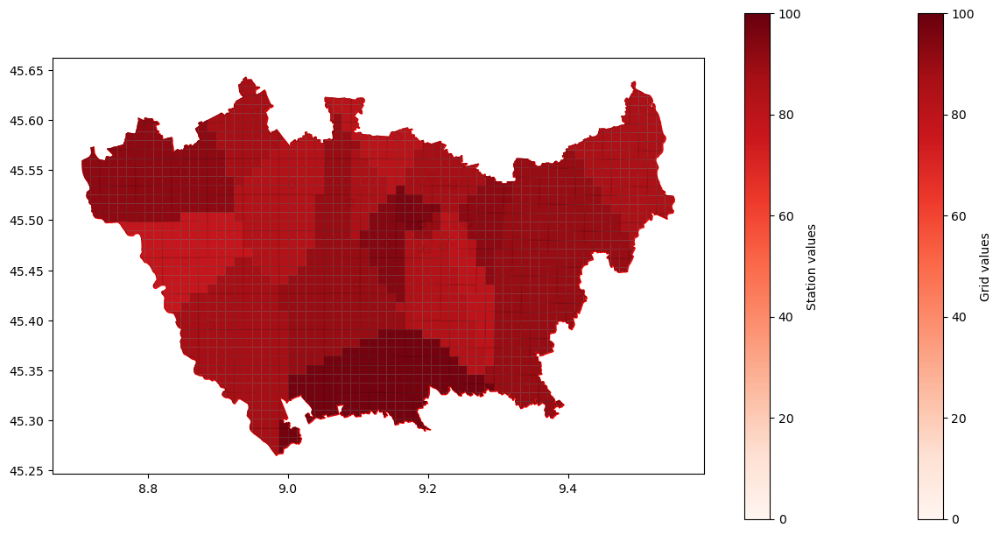

saved raster to ../best_model/rasters/stations_pm25_month_12.tiff
------ no2 --- month 1 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


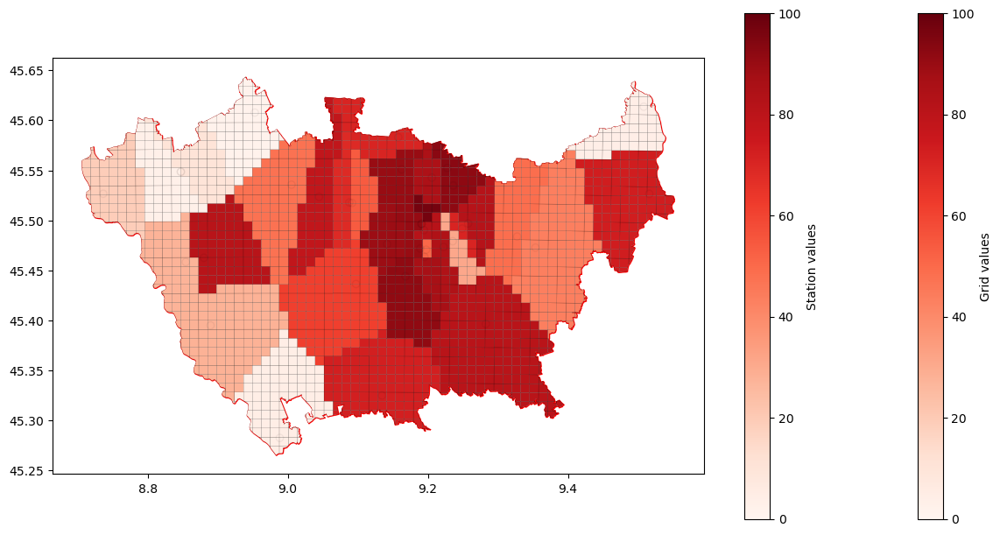

saved raster to ../best_model/rasters/stations_no2_month_1.tiff
------ no2 --- month 2 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


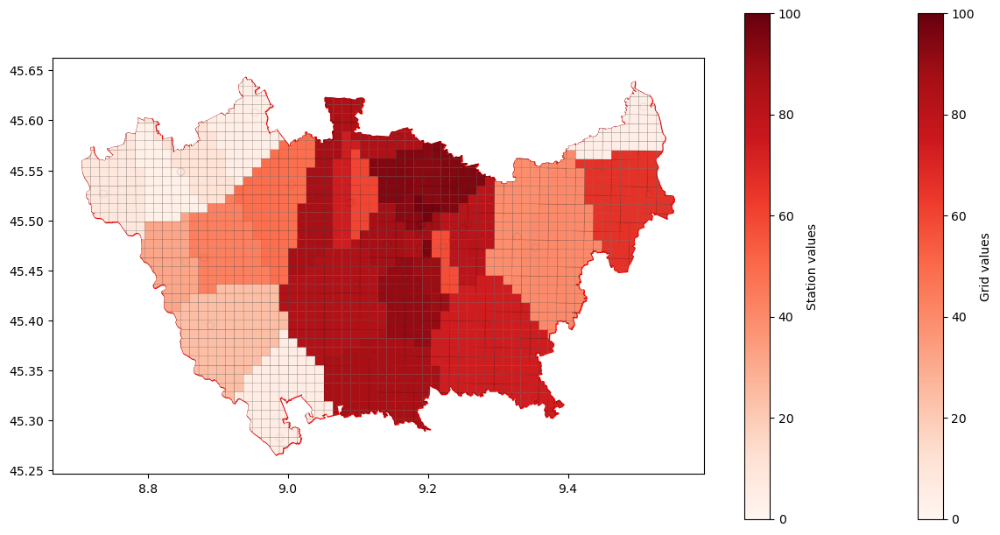

saved raster to ../best_model/rasters/stations_no2_month_2.tiff
------ no2 --- month 3 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


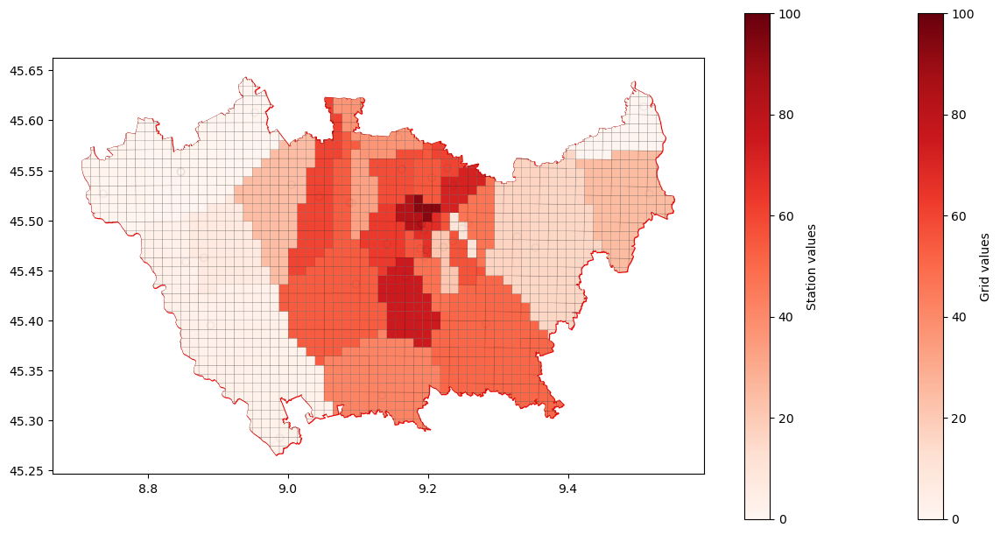

saved raster to ../best_model/rasters/stations_no2_month_3.tiff
------ no2 --- month 4 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


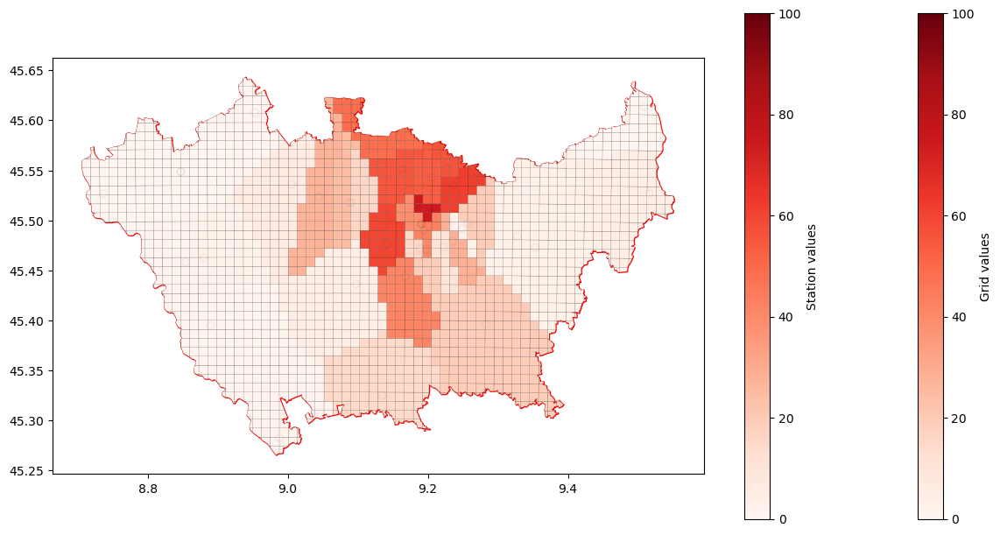

saved raster to ../best_model/rasters/stations_no2_month_4.tiff
------ no2 --- month 5 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


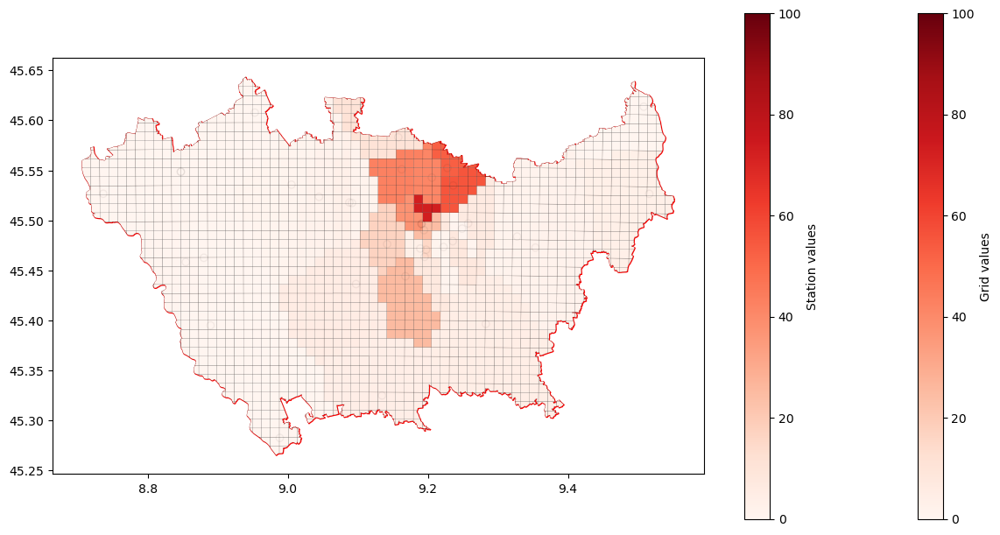

saved raster to ../best_model/rasters/stations_no2_month_5.tiff
------ no2 --- month 6 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


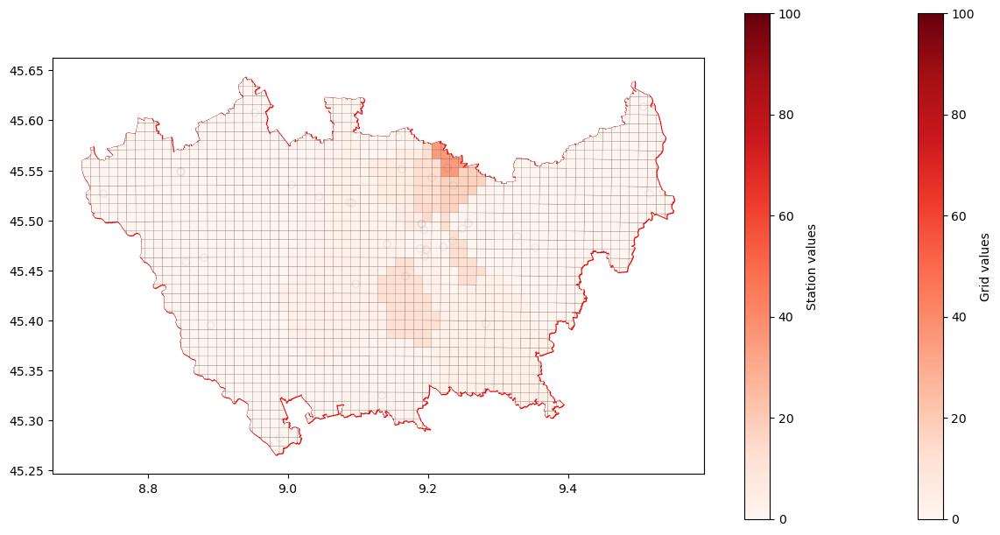

saved raster to ../best_model/rasters/stations_no2_month_6.tiff
------ no2 --- month 7 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


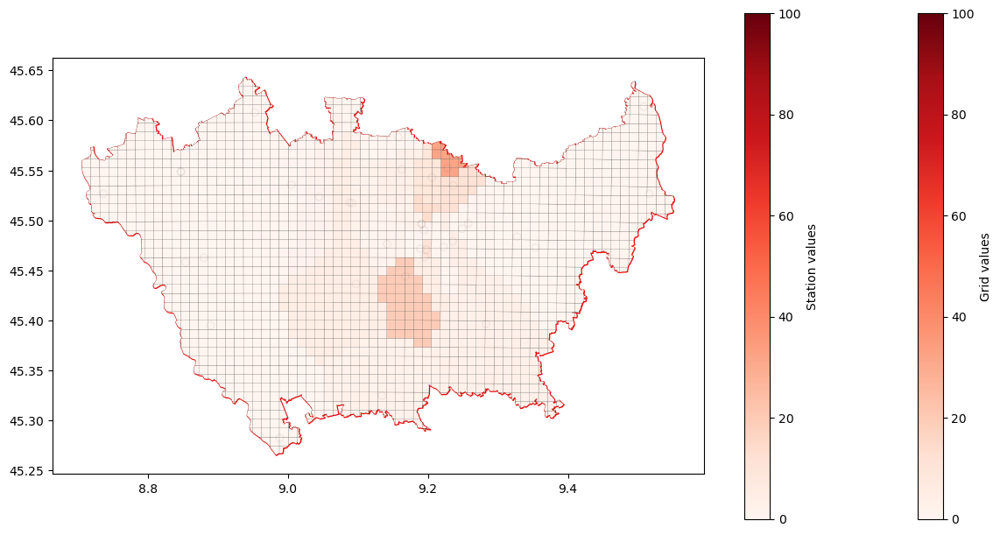

saved raster to ../best_model/rasters/stations_no2_month_7.tiff
------ no2 --- month 8 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


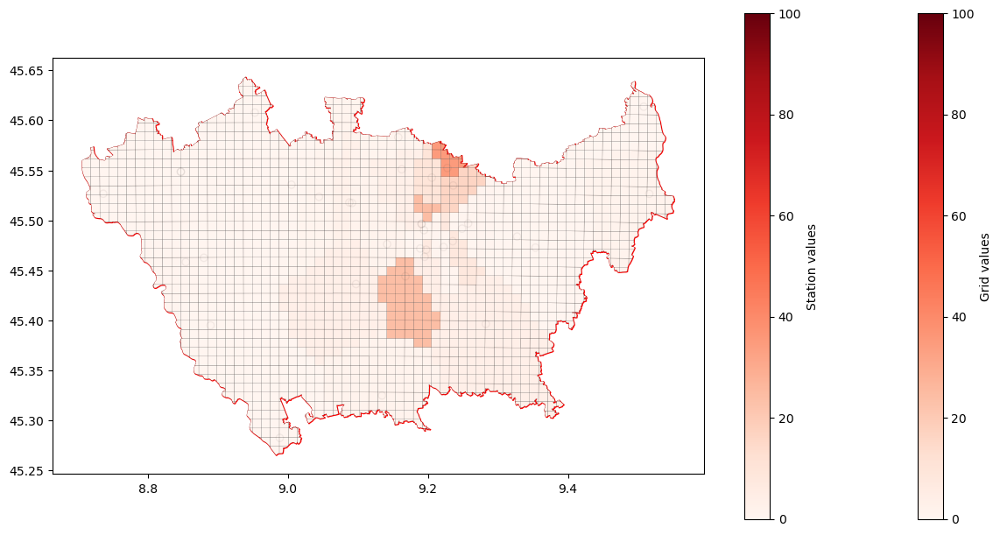

saved raster to ../best_model/rasters/stations_no2_month_8.tiff
------ no2 --- month 9 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


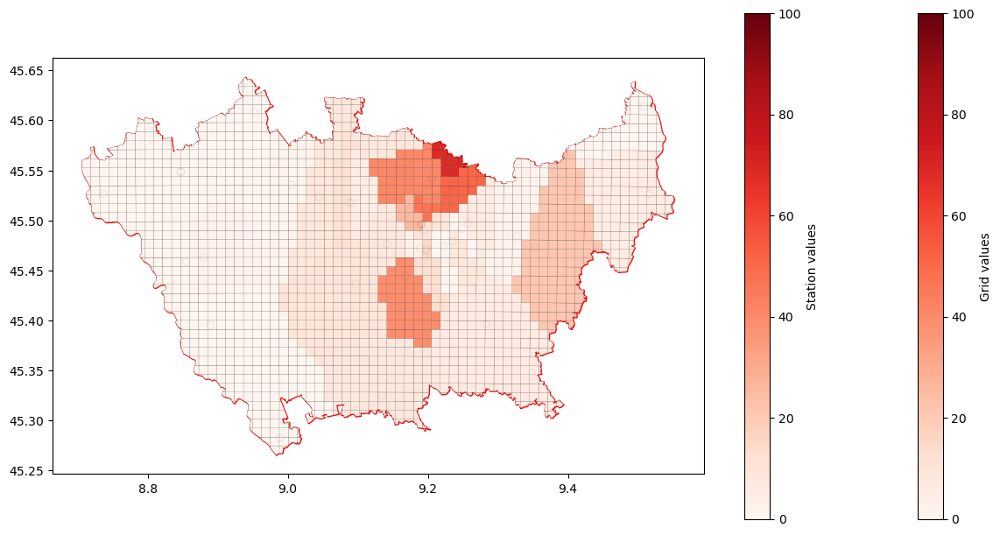

saved raster to ../best_model/rasters/stations_no2_month_9.tiff
------ no2 --- month 10 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


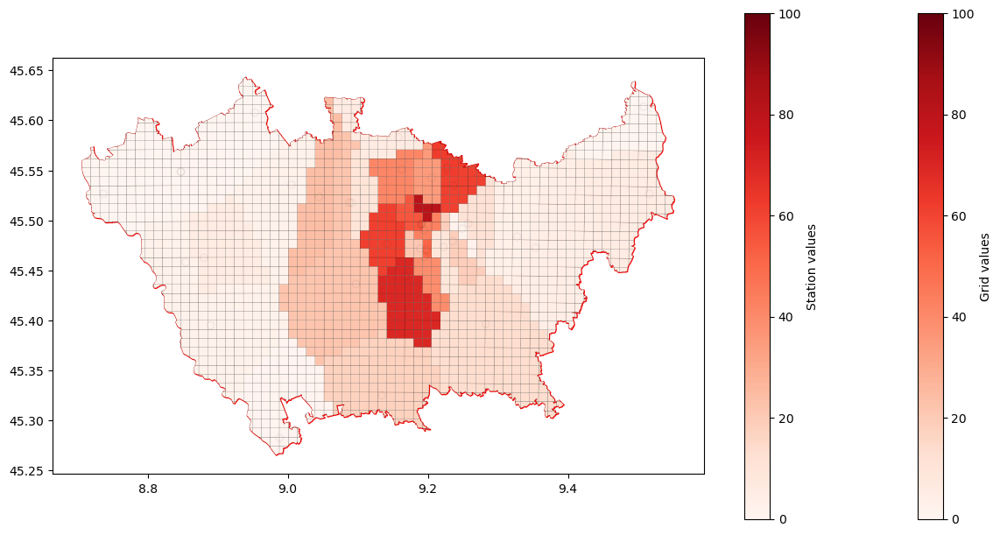

saved raster to ../best_model/rasters/stations_no2_month_10.tiff
------ no2 --- month 11 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


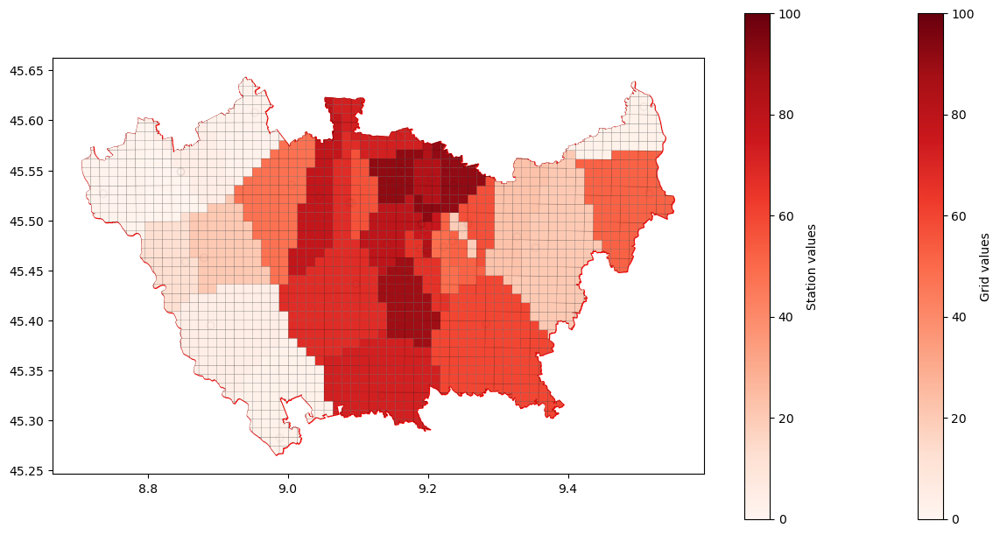

saved raster to ../best_model/rasters/stations_no2_month_11.tiff
------ no2 --- month 12 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


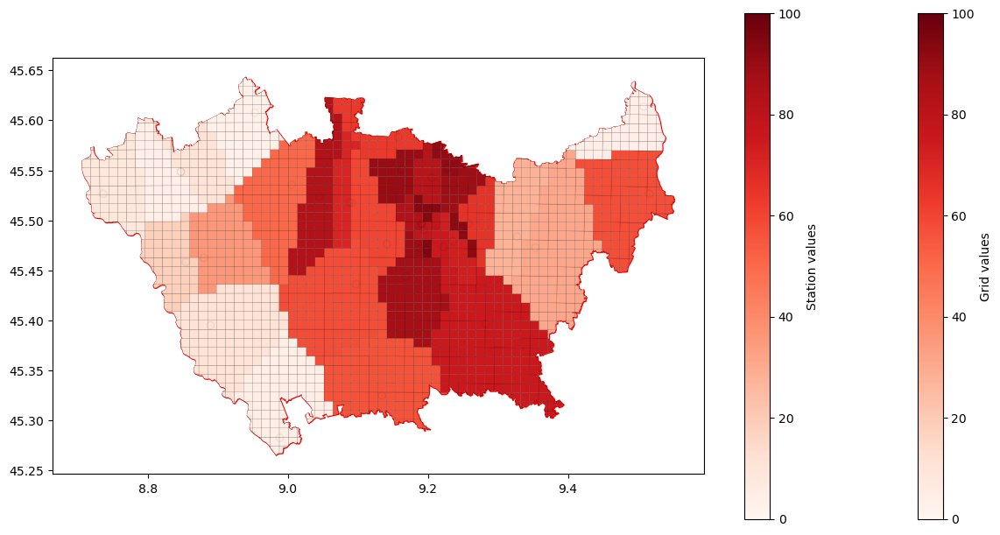

saved raster to ../best_model/rasters/stations_no2_month_12.tiff


In [14]:
#Generate rasters with stations data
best_raster_base_path = f'../best_model/rasters'
for pollutant in pollutants:
    for m in range(1,13):
        prediction_path = f'{best_base_path_predictions}/best_{pollutant}_stations_month_{m}.csv'
        prediction_m =  importer.import_df(prediction_path, date_format=None)
        print(f"------ {pollutant} --- month {m} ------")
        interpolated_to_grid,b = interp.interpolate(
            'exc', 
            'NN', 
            milano_shapefile,
            prediction_m.copy(), 
            visual_output=True,
            epsg_utm=milano_epsg
        )

        new_interp = pd.DataFrame()
        new_interp['y'] = interpolated_to_grid.original_centroids.y
        new_interp['x'] = interpolated_to_grid.original_centroids.x
        new_interp['value'] = interpolated_to_grid.NN
        interp_xar = new_interp.set_index(['y', 'x']).to_xarray()

        raster_path = f'{best_raster_base_path}/stations_{pollutant}_month_{m}.tiff'
        
        array_to_write = np.flip(np.flip(interp_xar.value.to_numpy()), axis=1)
        profile = {
            'driver': 'GTiff', 
            'dtype': 'float32', 
            'nodata': -9999.0, 
            'width': int(len(interp_xar.x)), 
            'height': int(len(interp_xar.y)), 
            'count': 1, 
            'crs': rio.CRS.from_epsg(32632), 
            'transform': rio.Affine(1000.0, 0.0, int(interp_xar.x[0]), 0.0, -1000.0, int(interp_xar.y[-1])), 
            'tiled': False, 
            'interleave': 'band'
        }
        with rio.open(raster_path, 'w', **profile) as dest:
            dest.write(array_to_write, 1)
    
        #prediction_raster = interp.save_as_raster(new_interp, raster_path, crs=milano_epsg)
        print(f"saved raster to {raster_path}")
    

------ pm10 --- month 1 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


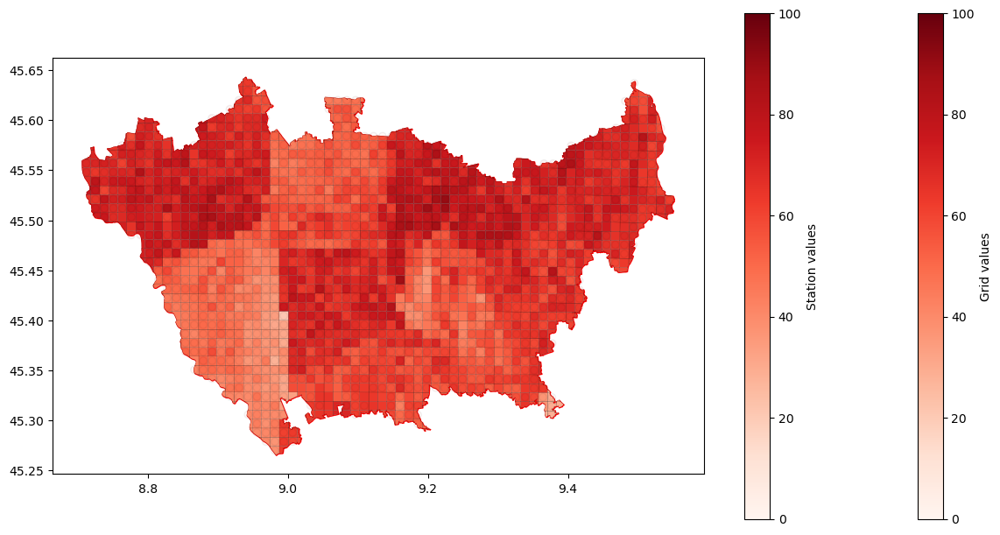

saved raster to ../best_model/rasters/grid_pm10_month_1.tiff
------ pm10 --- month 2 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


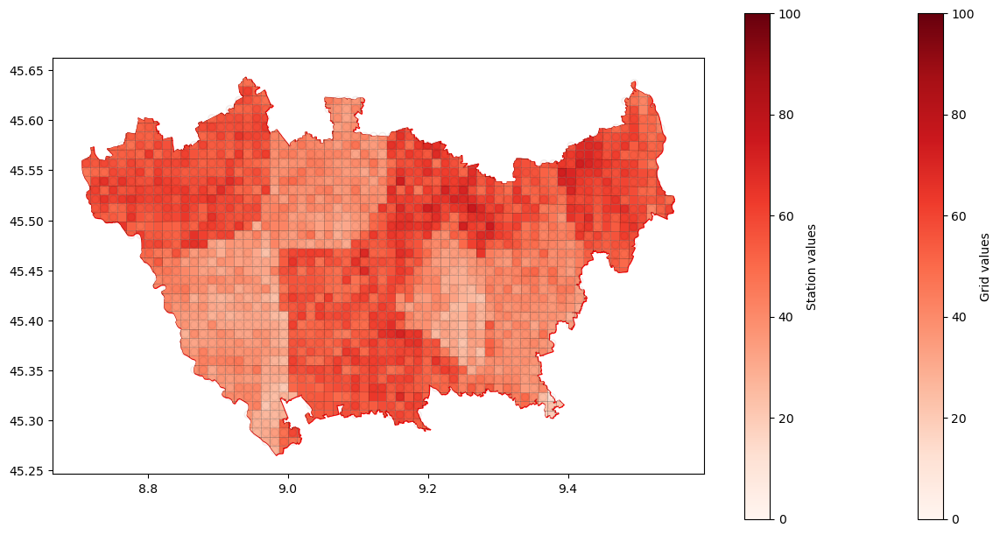

saved raster to ../best_model/rasters/grid_pm10_month_2.tiff
------ pm10 --- month 3 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


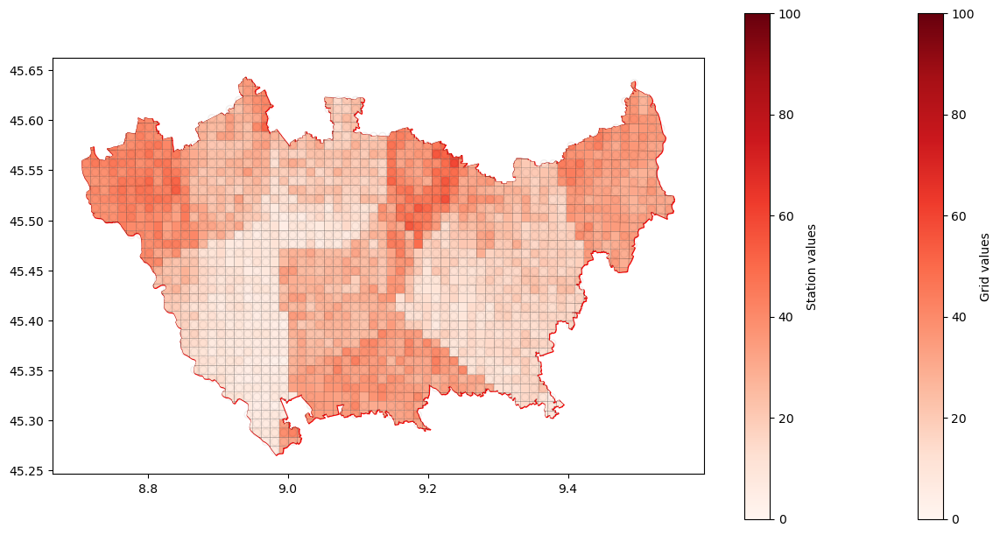

saved raster to ../best_model/rasters/grid_pm10_month_3.tiff
------ pm10 --- month 4 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


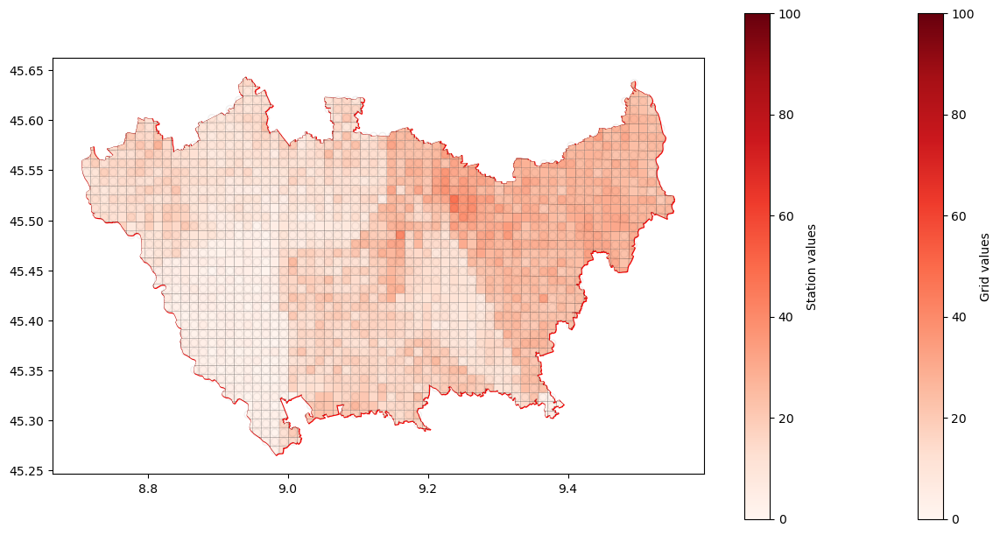

saved raster to ../best_model/rasters/grid_pm10_month_4.tiff
------ pm10 --- month 5 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


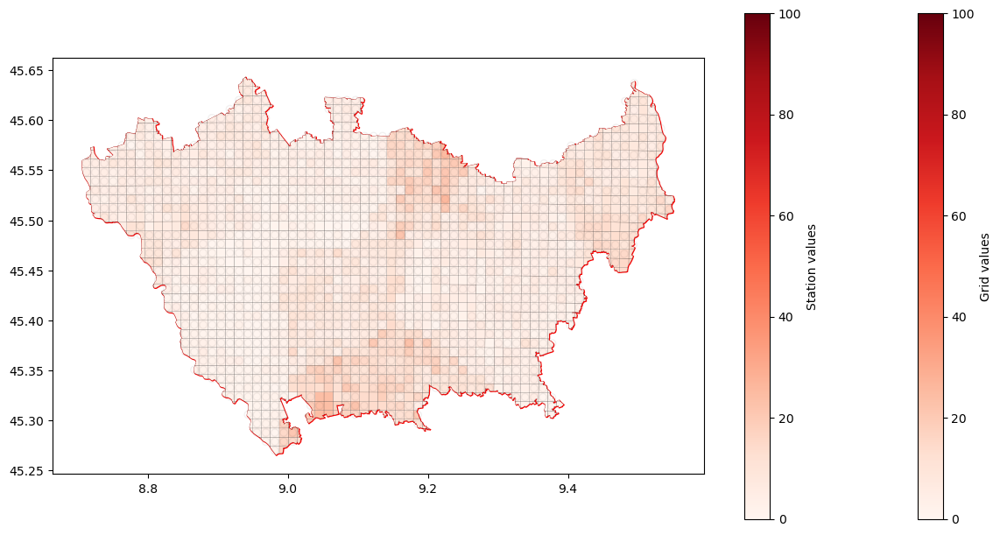

saved raster to ../best_model/rasters/grid_pm10_month_5.tiff
------ pm10 --- month 6 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


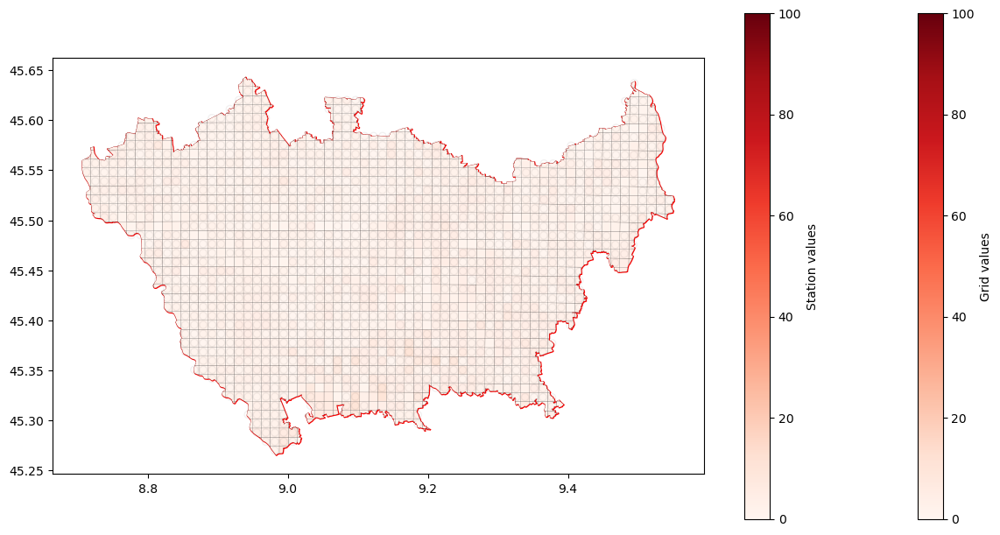

saved raster to ../best_model/rasters/grid_pm10_month_6.tiff
------ pm10 --- month 7 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


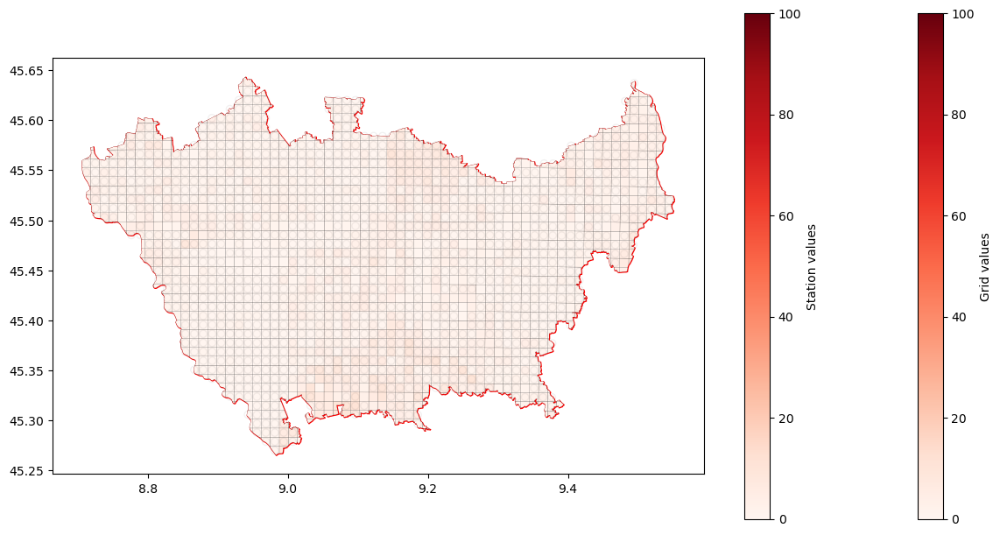

saved raster to ../best_model/rasters/grid_pm10_month_7.tiff
------ pm10 --- month 8 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


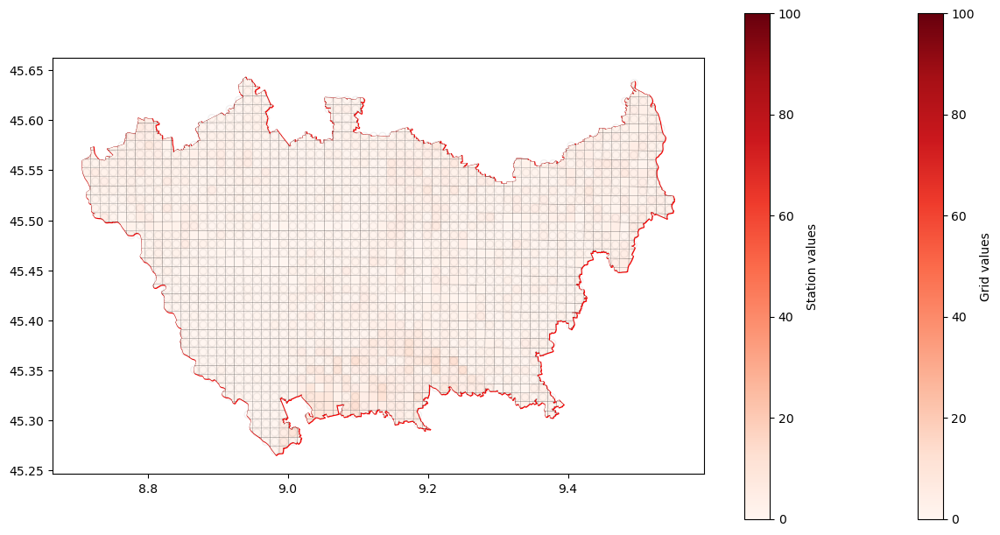

saved raster to ../best_model/rasters/grid_pm10_month_8.tiff
------ pm10 --- month 9 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


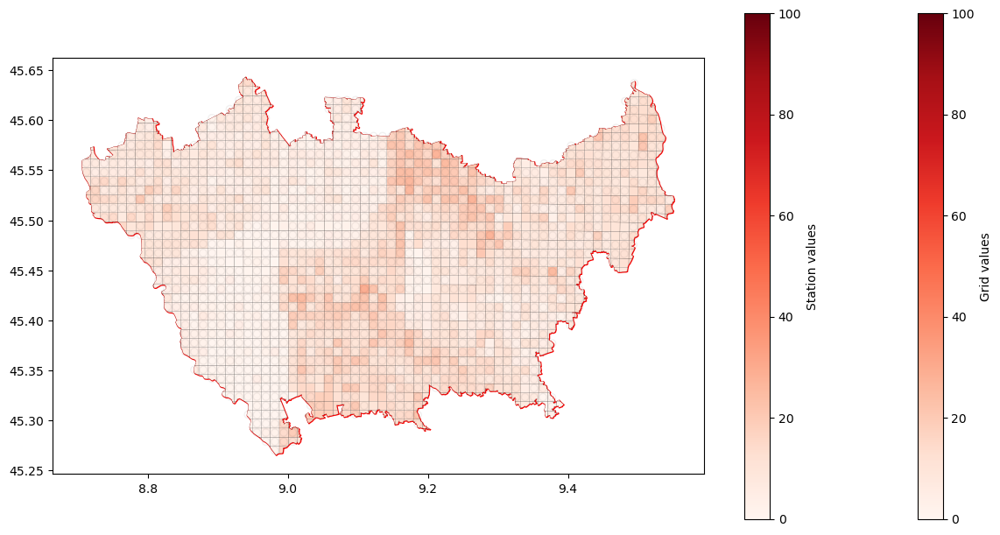

saved raster to ../best_model/rasters/grid_pm10_month_9.tiff
------ pm10 --- month 10 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


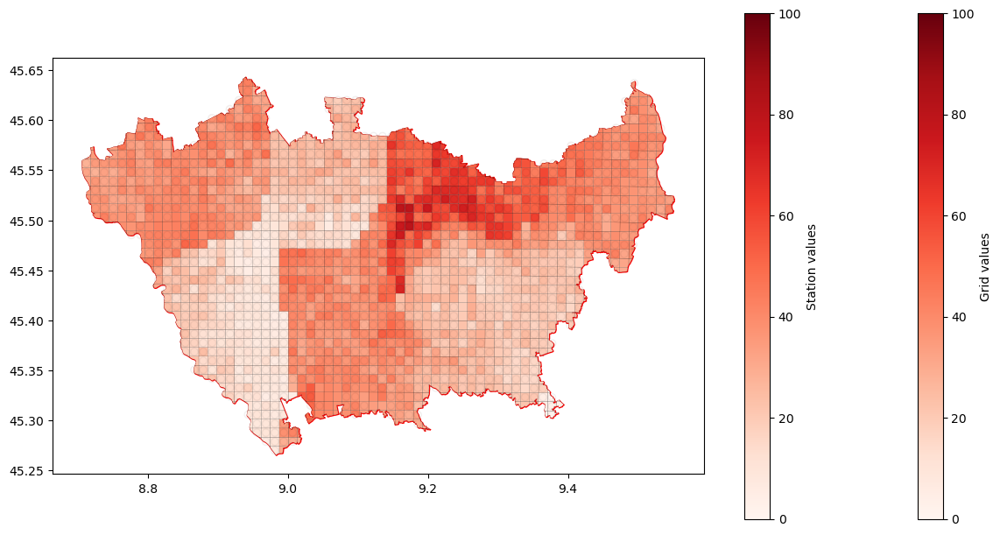

saved raster to ../best_model/rasters/grid_pm10_month_10.tiff
------ pm10 --- month 11 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


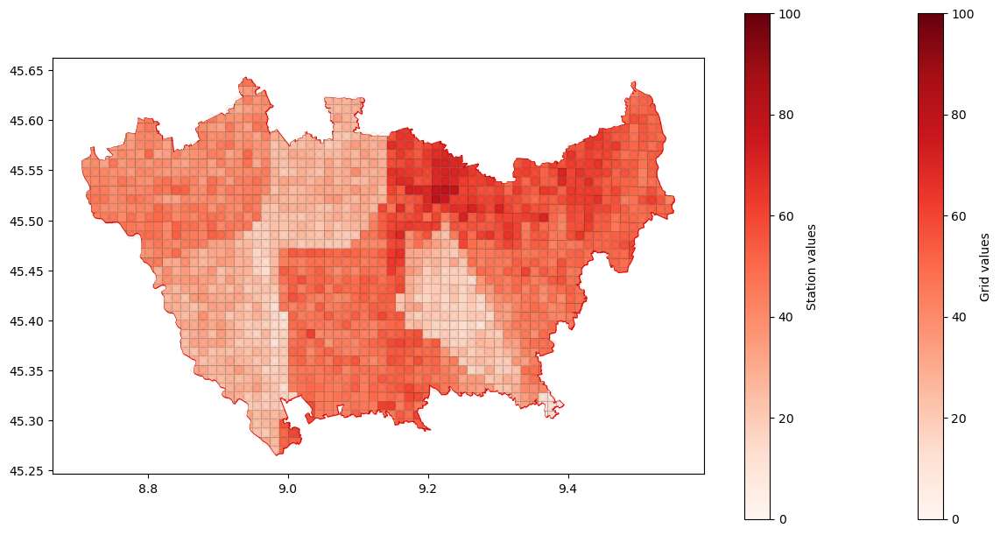

saved raster to ../best_model/rasters/grid_pm10_month_11.tiff
------ pm10 --- month 12 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


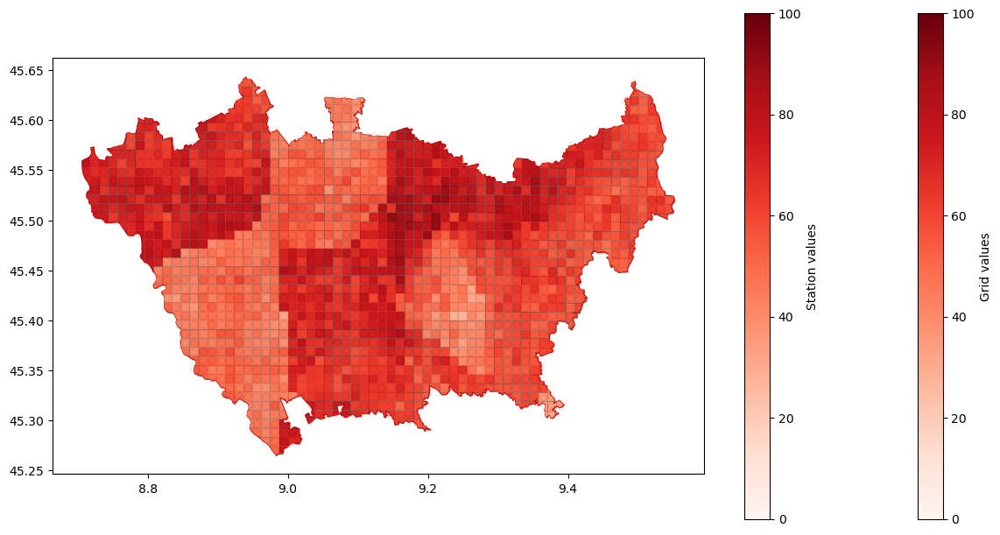

saved raster to ../best_model/rasters/grid_pm10_month_12.tiff
------ pm25 --- month 1 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


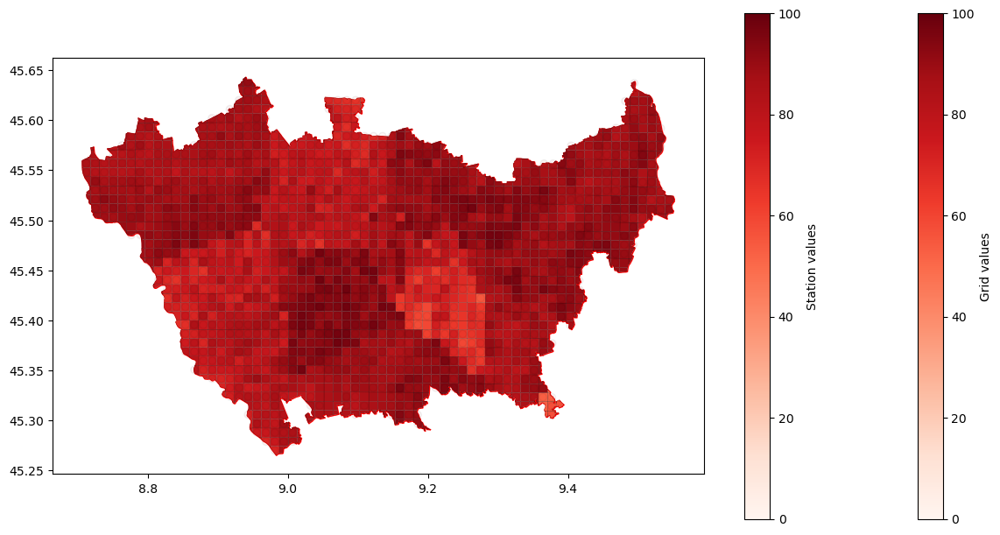

saved raster to ../best_model/rasters/grid_pm25_month_1.tiff
------ pm25 --- month 2 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


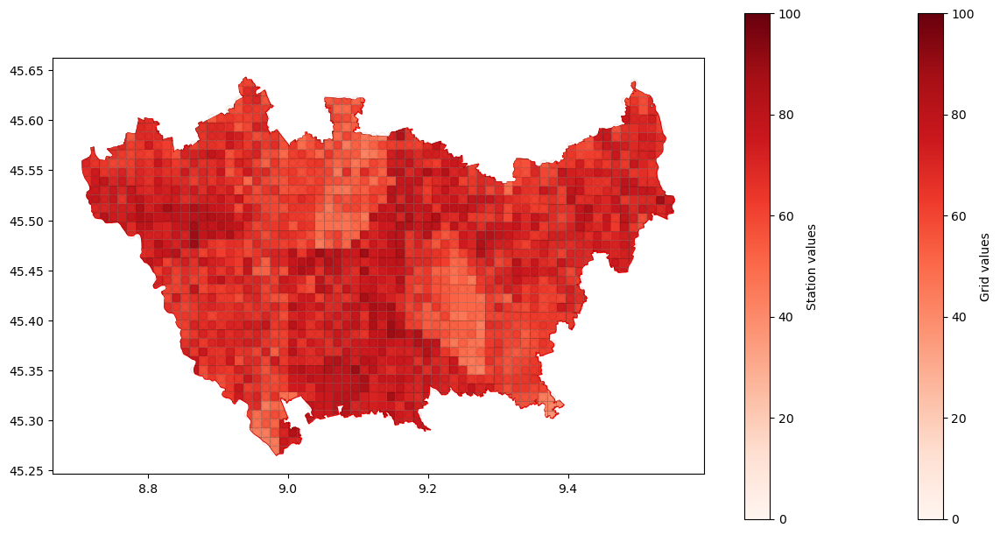

saved raster to ../best_model/rasters/grid_pm25_month_2.tiff
------ pm25 --- month 3 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


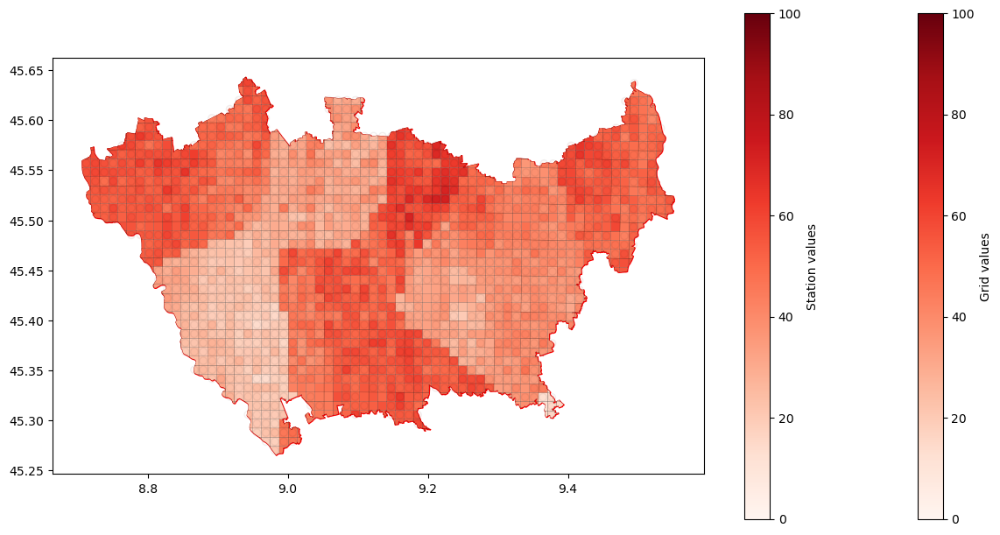

saved raster to ../best_model/rasters/grid_pm25_month_3.tiff
------ pm25 --- month 4 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


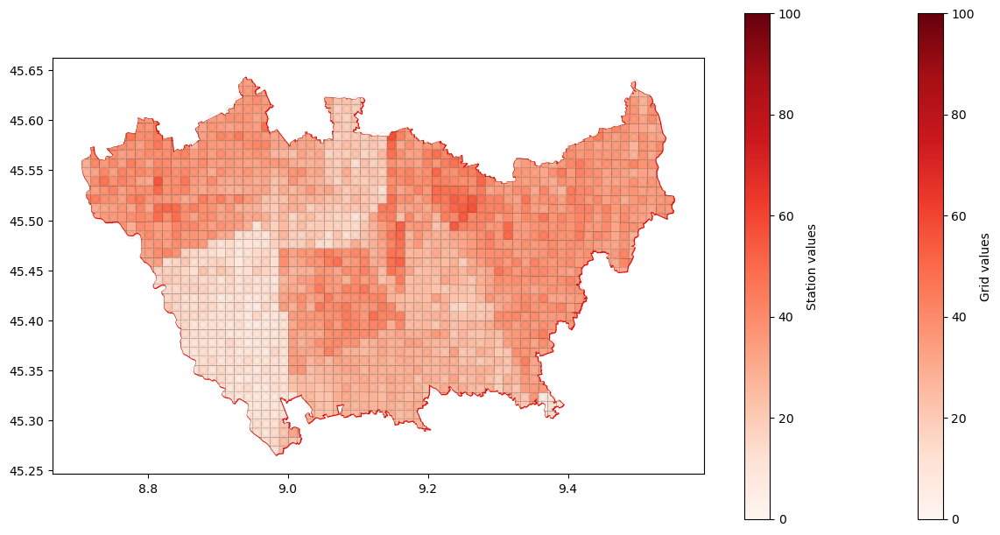

saved raster to ../best_model/rasters/grid_pm25_month_4.tiff
------ pm25 --- month 5 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


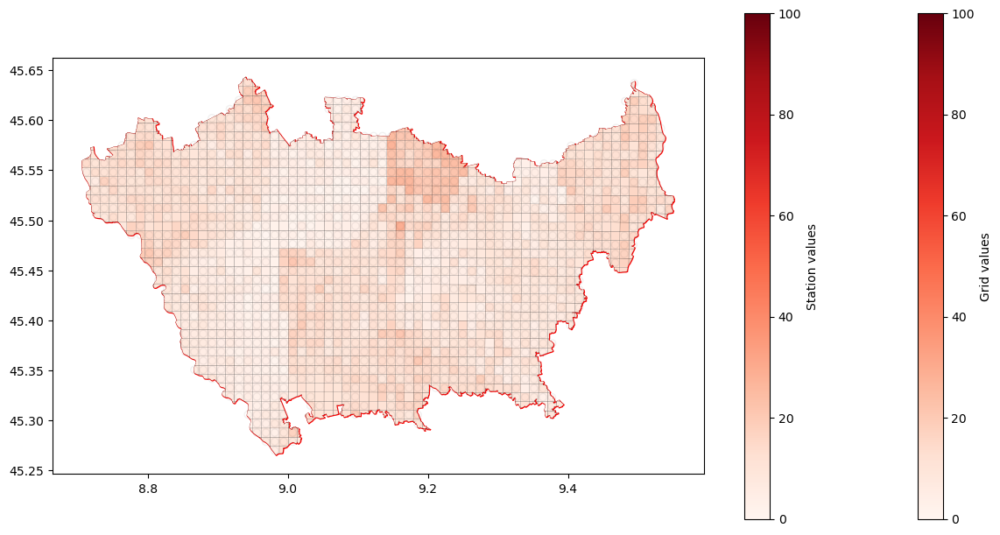

saved raster to ../best_model/rasters/grid_pm25_month_5.tiff
------ pm25 --- month 6 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


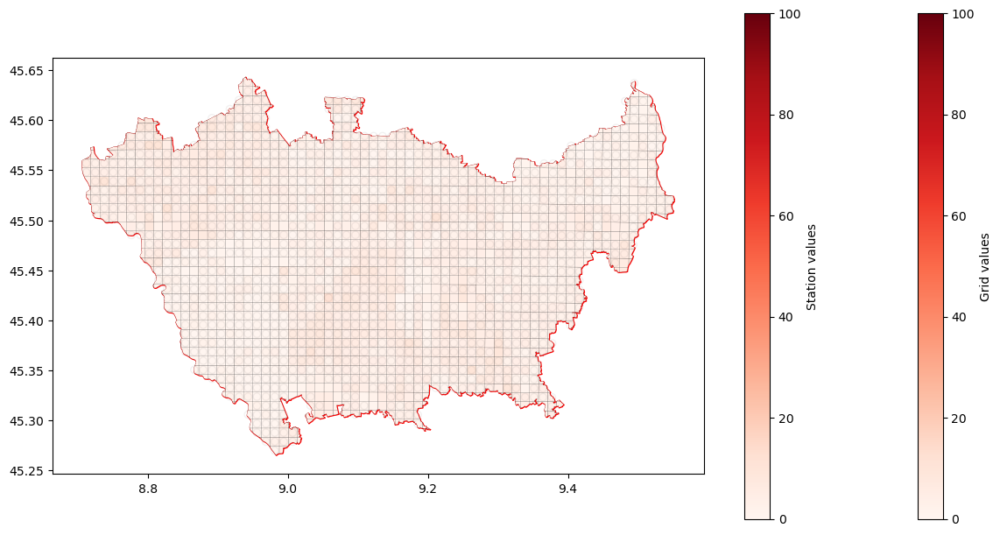

saved raster to ../best_model/rasters/grid_pm25_month_6.tiff
------ pm25 --- month 7 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


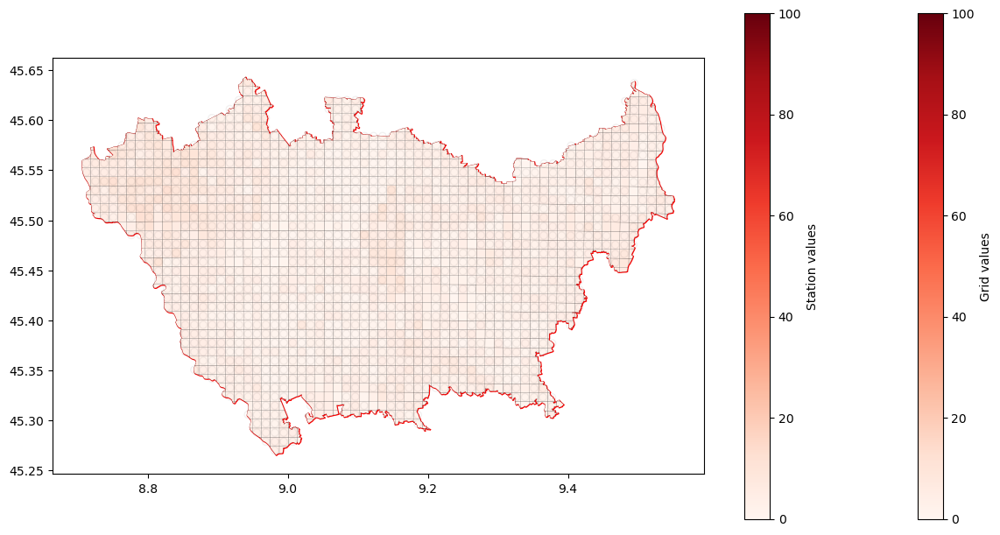

saved raster to ../best_model/rasters/grid_pm25_month_7.tiff
------ pm25 --- month 8 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


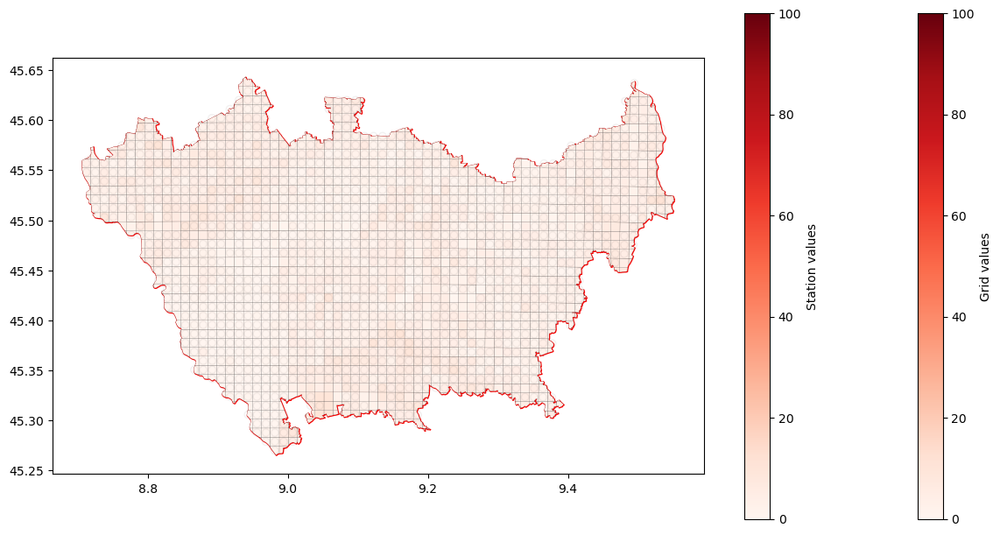

saved raster to ../best_model/rasters/grid_pm25_month_8.tiff
------ pm25 --- month 9 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


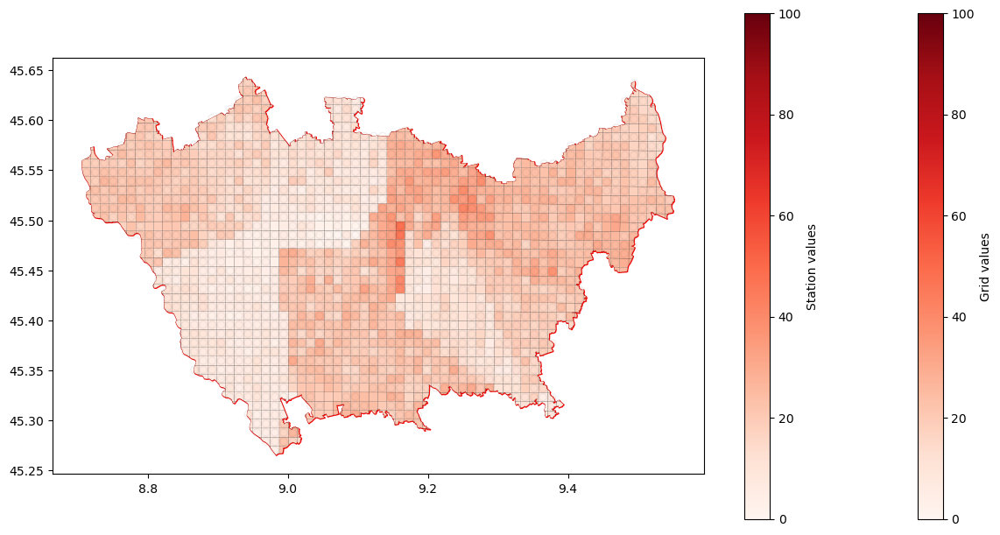

saved raster to ../best_model/rasters/grid_pm25_month_9.tiff
------ pm25 --- month 10 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


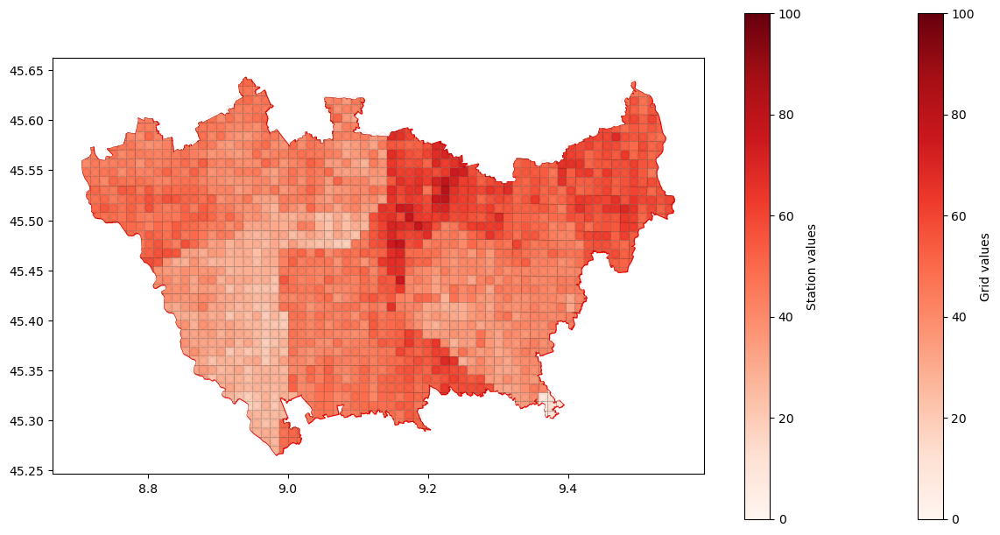

saved raster to ../best_model/rasters/grid_pm25_month_10.tiff
------ pm25 --- month 11 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


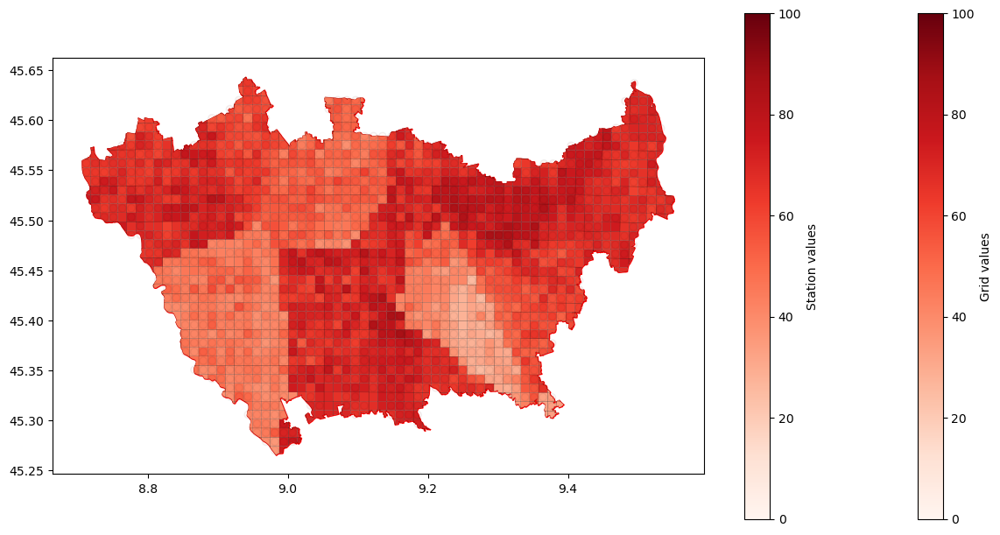

saved raster to ../best_model/rasters/grid_pm25_month_11.tiff
------ pm25 --- month 12 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


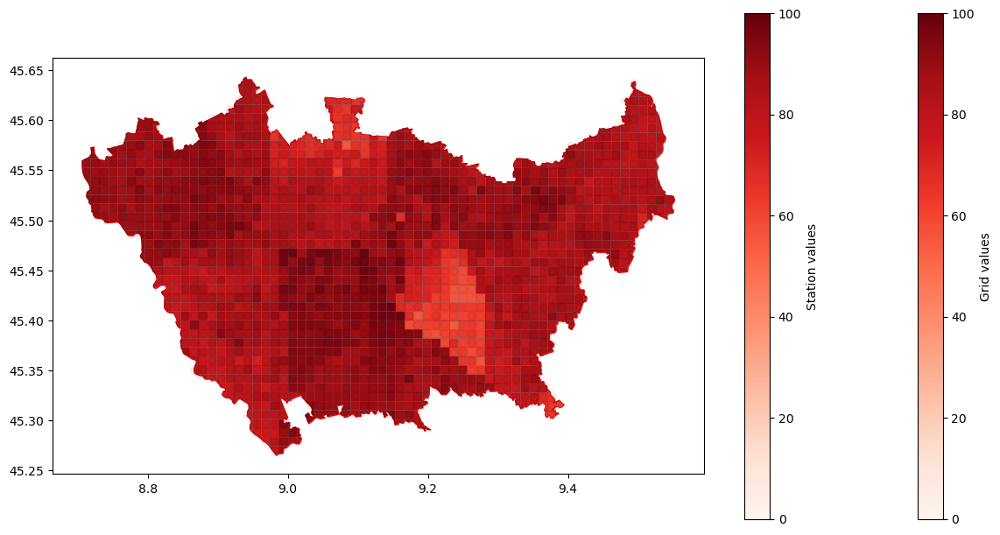

saved raster to ../best_model/rasters/grid_pm25_month_12.tiff
------ no2 --- month 1 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


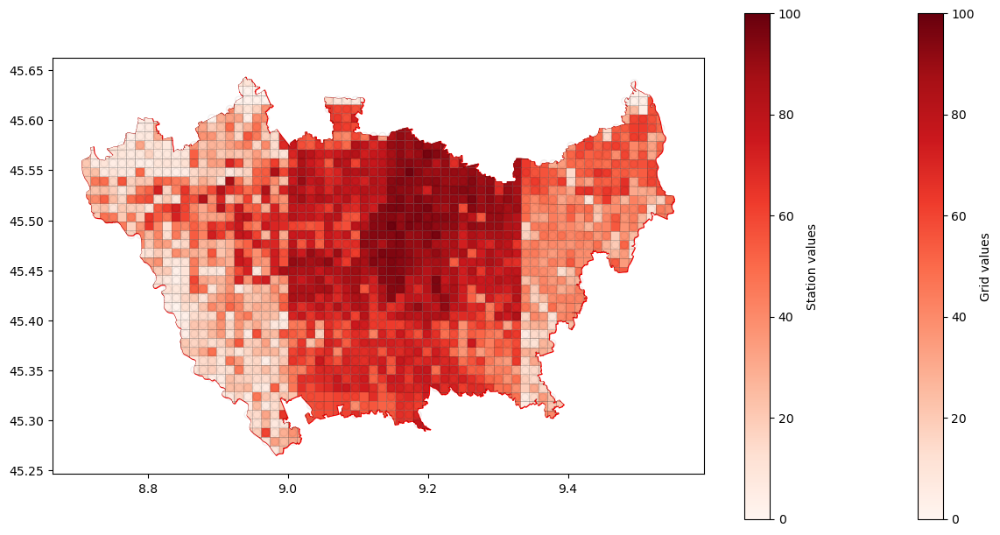

saved raster to ../best_model/rasters/grid_no2_month_1.tiff
------ no2 --- month 2 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


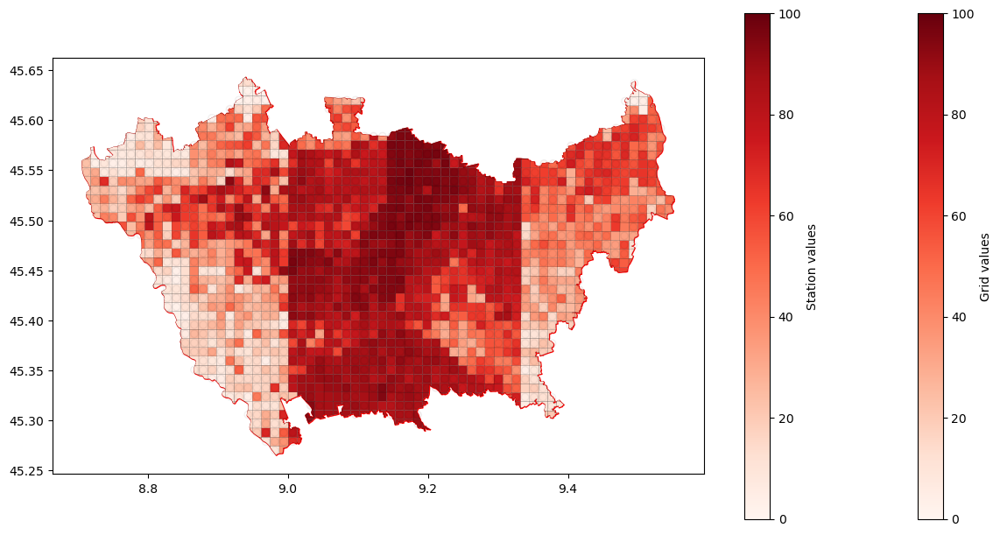

saved raster to ../best_model/rasters/grid_no2_month_2.tiff
------ no2 --- month 3 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


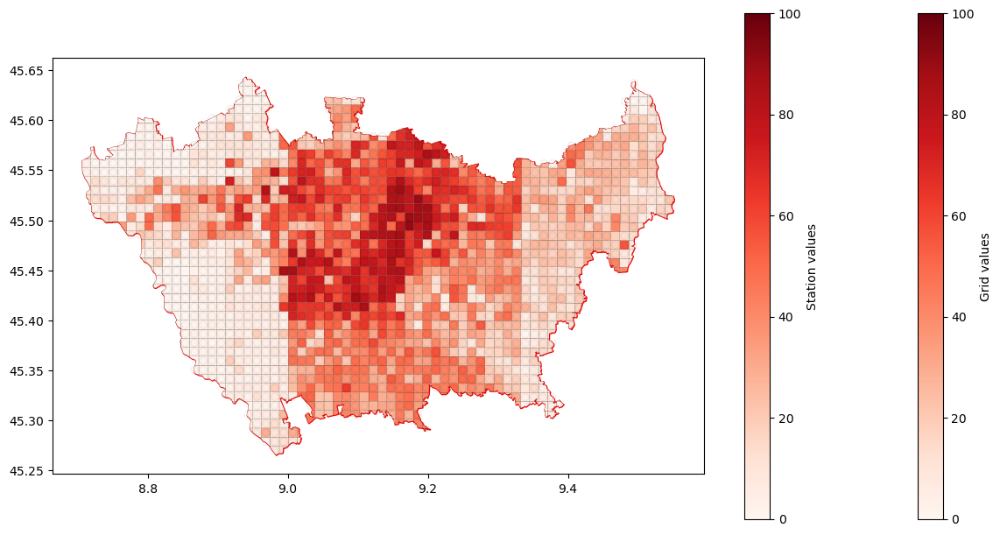

saved raster to ../best_model/rasters/grid_no2_month_3.tiff
------ no2 --- month 4 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


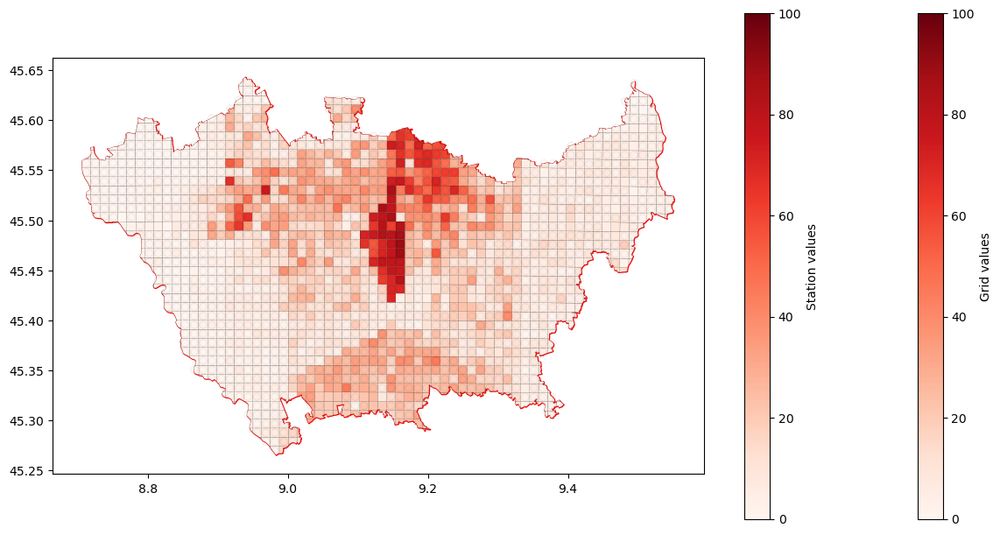

saved raster to ../best_model/rasters/grid_no2_month_4.tiff
------ no2 --- month 5 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


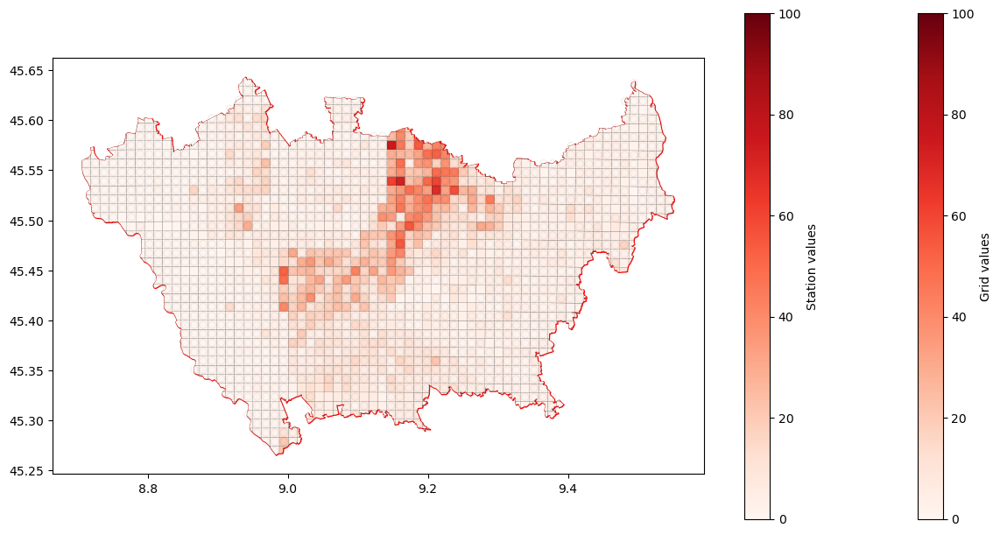

saved raster to ../best_model/rasters/grid_no2_month_5.tiff
------ no2 --- month 6 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


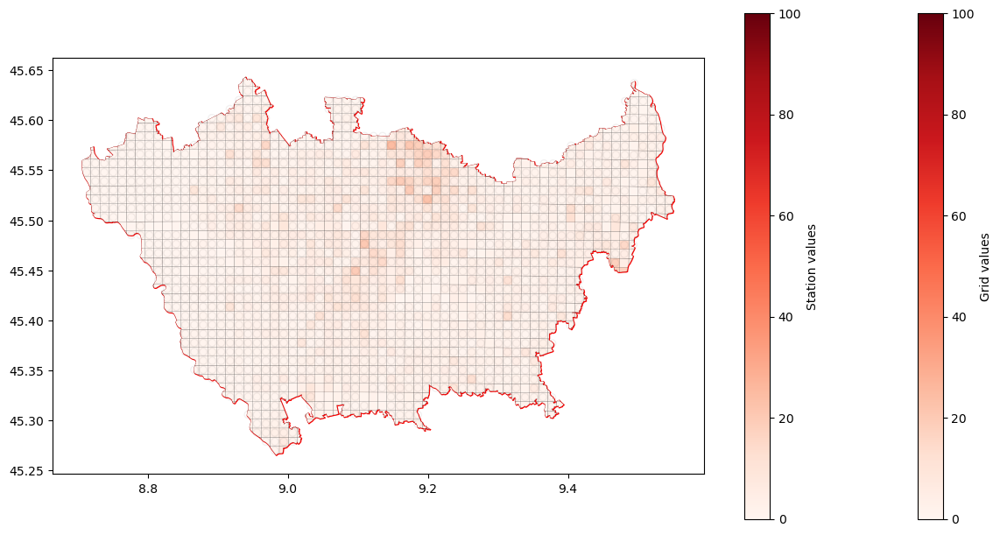

saved raster to ../best_model/rasters/grid_no2_month_6.tiff
------ no2 --- month 7 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


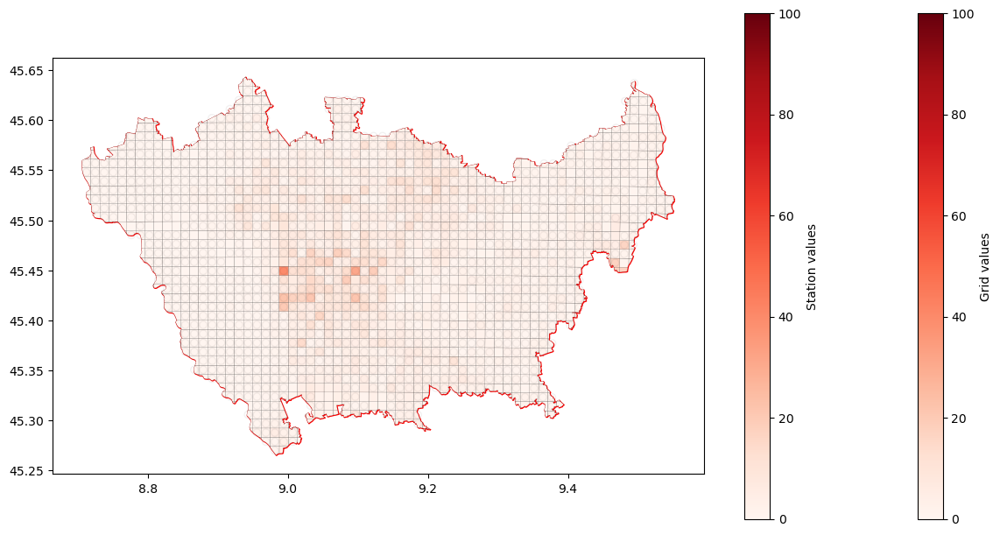

saved raster to ../best_model/rasters/grid_no2_month_7.tiff
------ no2 --- month 8 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


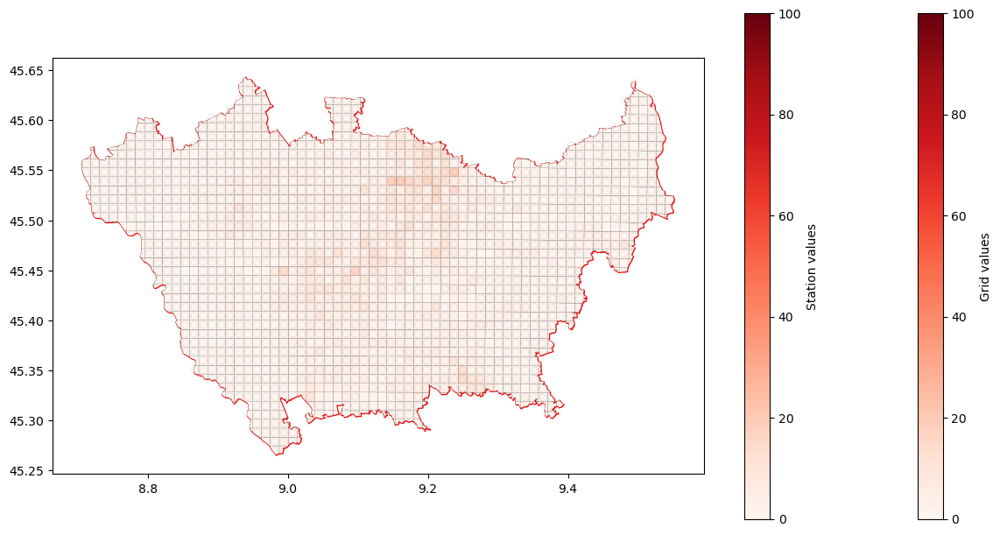

saved raster to ../best_model/rasters/grid_no2_month_8.tiff
------ no2 --- month 9 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


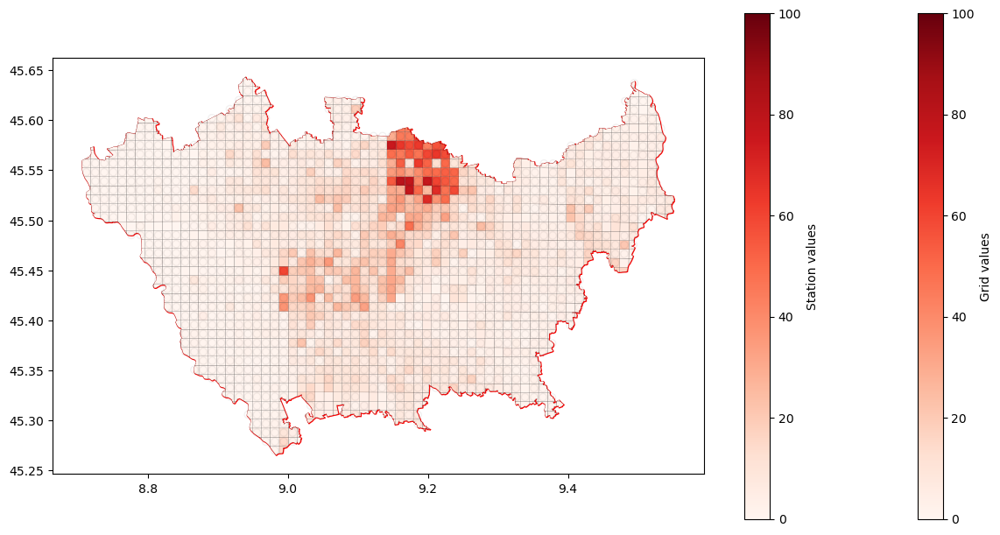

saved raster to ../best_model/rasters/grid_no2_month_9.tiff
------ no2 --- month 10 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


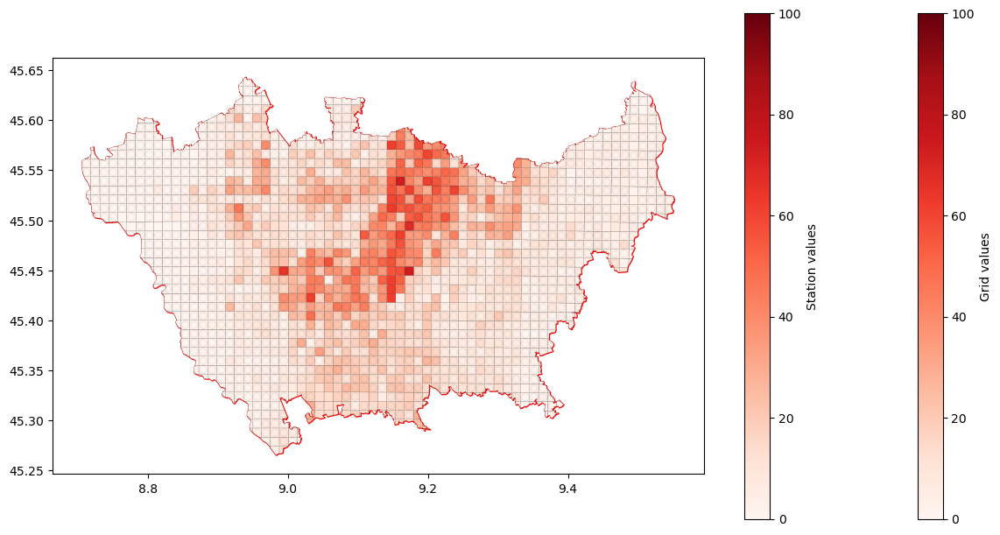

saved raster to ../best_model/rasters/grid_no2_month_10.tiff
------ no2 --- month 11 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


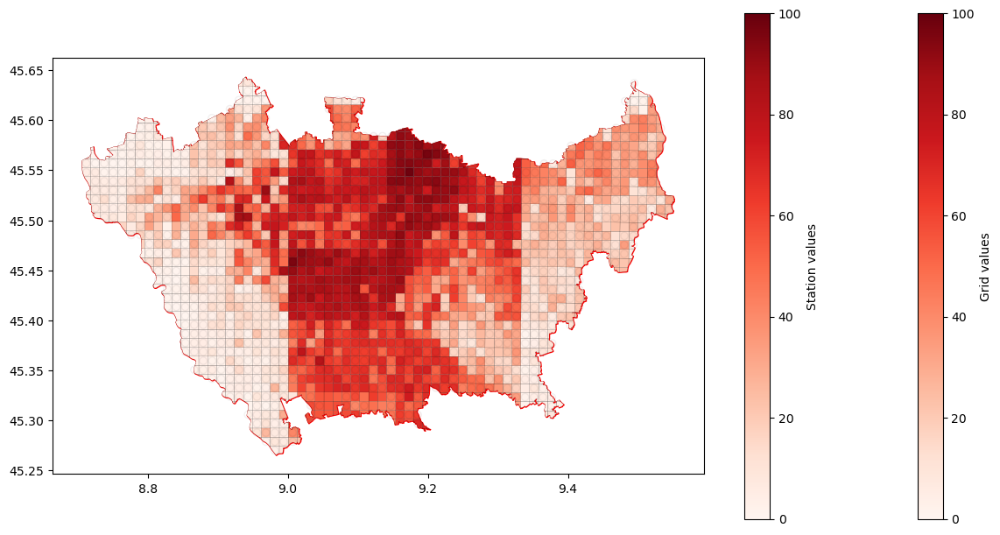

saved raster to ../best_model/rasters/grid_no2_month_11.tiff
------ no2 --- month 12 ------
Creating an interpolation with the Nearest Neighbour method
Plotting the results...


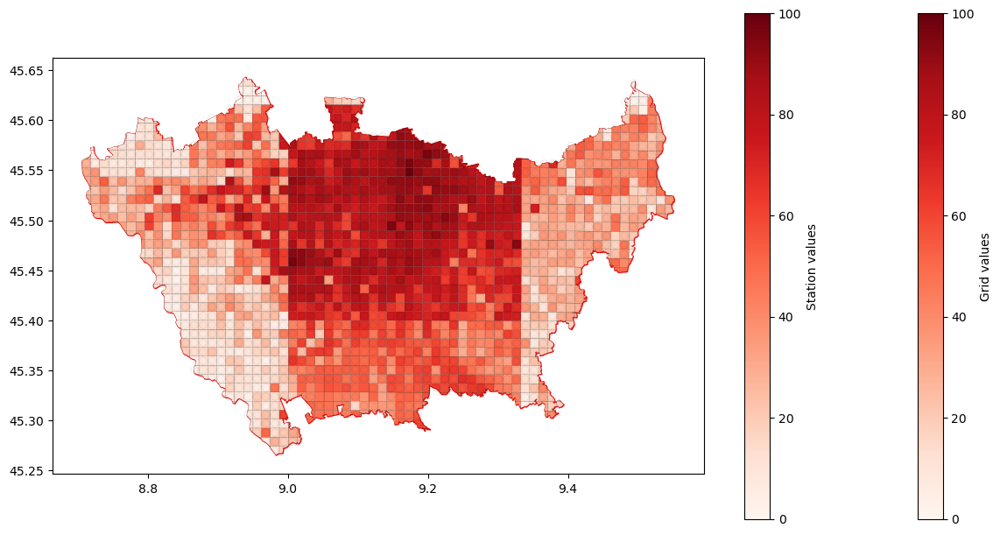

saved raster to ../best_model/rasters/grid_no2_month_12.tiff


In [15]:
#Generate rasters with grid data
best_raster_base_path = f'../best_model/rasters'
for pollutant in pollutants:
    for m in range(1,13):
        prediction_path = f'{best_base_path_predictions}/best_{pollutant}_grid_month_{m}.csv'
        prediction_m =  importer.import_df(prediction_path, date_format=None)
        print(f"------ {pollutant} --- month {m} ------")

        interpolated_to_grid,b = interp.interpolate(
            'exc', 
            'NN', 
            milano_shapefile, 
            prediction_m, 
            visual_output=True,
            epsg_utm=milano_epsg
        )

        new_interp = pd.DataFrame()
        new_interp['y'] = interpolated_to_grid.original_centroids.y
        new_interp['x'] = interpolated_to_grid.original_centroids.x
        new_interp['value'] = interpolated_to_grid.NN
        
        interp_xar = new_interp.set_index(['y', 'x']).to_xarray()

        raster_path = f'{best_raster_base_path}/grid_{pollutant}_month_{m}.tiff'
        
        array_to_write = np.flip(np.flip(interp_xar.value.to_numpy()), axis=1)
        profile = {
            'driver': 'GTiff', 
            'dtype': 'float32', 
            'nodata': -9999.0, 
            'width': int(len(interp_xar.x)), 
            'height': int(len(interp_xar.y)), 
            'count': 1, 
            'crs': rio.CRS.from_epsg(32632), 
            'transform': rio.Affine(1000.0, 0.0, int(interp_xar.x[0]), 0.0, -1000.0, int(interp_xar.y[-1])), 
            'tiled': False, 
            'interleave': 'band'
        }
        with rio.open(raster_path, 'w', **profile) as dest:
            dest.write(array_to_write, 1)

        
        #prediction_raster = interp.save_as_raster(new_interp, raster_path, crs=milano_epsg)
        print(f"saved raster to {raster_path}")
    

In [ ]:
#PREDICT ALL!
best_base_path_predictions = f'../harmonia_processor'
for pollutant in pollutants:
    print(f"FOR {pollutant}")
    for model_to_use in models:
        print(f"FOR {model_to_use}")
        for train_mode in train_modes:
            print(f"FOR {train_mode}")
            prefix = model_options[model_to_use]['prefix']

            train_path = f'{best_base_path_predictions}/{pollutant}/train/training_{train_mode}.csv'
            training_dataset = importer.import_df(train_path, date_format='%Y-%m-%d')
            training_dataset = training_dataset.dropna()
            training_dates = training_dataset.copy()[['date']]
            if 'date' in list(training_dataset.columns):
                training_dataset = training_dataset.drop(['date'], axis=1)

            test_path = f'{best_base_path_predictions}/{pollutant}/train/validation_{train_mode}.csv'
            testing_dataset = importer.import_df(test_path, date_format='%Y-%m-%d')
            testing_dataset = testing_dataset.dropna()
            testing_dates = testing_dataset.copy()[['date']]
            if 'date' in list(testing_dataset.columns):
                testing_dataset = testing_dataset.drop(['date'], axis=1)

            #save the training columns for selecting them in the prediction dataset
            training_columns = list(training_dataset.columns)
            if 'exc' in training_columns:
                training_columns.remove('exc')

            model_path = f'{best_base_path_predictions}/{pollutant}/model/{prefix}_model_{train_mode}.csv'
            ai_model = ai.MLProcessor(training_dataset.copy(), testing_dataset.copy())
            ai_model.load_model(model_path)
            ai_model.model_type = model_to_use

            predictions = {}
            predictions_grid = {}
            predicts = {}
            predicts_grid = {}

            for m in range(1,13):
                print(f'FOR {pollutant} MONTH {m}')
                print(f"Predicting in stations datasets")
                predict_path = f'{best_base_path_predictions}/{pollutant}/predict/stations_month_{m}.csv'
                prediction_df =  importer.import_df(predict_path, date_format=None)
                prediction_dataset = prediction_df.copy()
                prediction_dataset = prediction_dataset[training_columns]
                predicts[m] = prediction_df.copy()
                if 'date' in list(prediction_dataset.columns):
                    prediction_dataset = prediction_dataset.drop(['date'], axis=1)

                prediction_dataset = prediction_dataset.reset_index(drop=True).dropna()
                if model_to_use == 'lstm':
                    predicted_probabilities = ai_model.predict(
                        prediction_dataset.copy(), 
                        predict_options=model_options[model_to_use]['prediction_options']
                    )
                else:
                    predicted_probabilities = ai_model.predict_probabilities(
                        prediction_dataset.copy(),
                        predict_options=model_options[model_to_use]['prediction_options']
                    )
                    predicted_probabilities = predicted_probabilities[:,1]

                #Create a DF from predicted labels
                predicted_df = pd.DataFrame(predicted_probabilities)
                predicted_df.columns = ['exc']

                #Concat DF with UTM coordinates 
                predicted_df = predicted_df.reset_index(drop=True)
                prediction_locations = prediction_dataset[['lat','lng']].reset_index(drop=True)
                predicted_df = pd.concat([predicted_df, prediction_locations],axis=1)
                predicted_df['exc'] = predicted_df['exc']*100

                predictions[m] = predicted_df.copy()

                prediction_path = f'{best_base_path_predictions}/{pollutant}/predictions/{prefix}_prediction_month_{m}_stations_{train_mode}.csv'
                predictions[m].to_csv(prediction_path)


                print(f"Predicting in grid datasets")
                predict_path = f'{best_base_path_predictions}/{pollutant}/predict/grid_month_{m}.csv'
                prediction_df =  importer.import_df(predict_path, date_format=None)
                prediction_dataset = prediction_df.copy()
                prediction_dataset = prediction_dataset[training_columns]
                predicts_grid[m] = prediction_df.copy()
                if 'date' in list(prediction_dataset.columns):
                    prediction_dataset = prediction_dataset.drop(['date'], axis=1)


                prediction_dataset = prediction_dataset.reset_index(drop=True).dropna()
                if model_to_use == 'lstm':
                    predicted_probabilities = ai_model.predict(
                        prediction_dataset.copy(), 
                        predict_options=model_options[model_to_use]['prediction_options']
                    )
                else:
                    predicted_probabilities = ai_model.predict_probabilities(
                        prediction_dataset.copy(), 
                        predict_options=model_options[model_to_use]['prediction_options']
                    )
                    predicted_probabilities = predicted_probabilities[:,1]

                #Create a DF from predicted labels
                predicted_df = pd.DataFrame(predicted_probabilities)
                predicted_df.columns = ['exc']

                #Concat DF with UTM coordinates 
                #reset index to avoid indexing problems
                predicted_df = predicted_df.reset_index(drop=True)
                prediction_locations = prediction_dataset[['lat','lng']].reset_index(drop=True)
                predicted_df = pd.concat([predicted_df, prediction_locations],axis=1)
                predicted_df['exc'] = predicted_df['exc']*100

                predictions_grid[m] = predicted_df.copy()

                prediction_path = f'{best_base_path_predictions}/{pollutant}/predictions/{prefix}_prediction_month_{m}_grid_{train_mode}.csv'
                predictions_grid[m].to_csv(prediction_path)
